# Cluster Referral period

## Categorical Clustering

In [1]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

In [2]:
#import sweetviz as sv
import pandas as pd
#import dtale
import numpy as np
import prince
%matplotlib inline


import os
import json

#from pandas.io.json import json_normalize
from datetime import datetime 
from tqdm import tqdm
from sklearn.preprocessing import PowerTransformer
#import umap.plot
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy import stats

from sklearn.cluster import KMeans


#from functions import condense_category,cluster_profile

from lightgbm import LGBMClassifier
import shap
from sklearn.model_selection import cross_val_score
import seaborn as sns
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore')    
    warnings.filterwarnings("ignore", category=DeprecationWarning) 
pd.set_option('display.max_columns', None)

from sklearn.metrics import silhouette_samples , silhouette_score
import matplotlib.cm as cm
from kmodes.kmodes import KModes
from kmodes import kprototypes
from sklearn.metrics import silhouette_score
import plotly.express as px
import logging
logging.getLogger('matplotlib.font_manager').disabled = True
import seaborn as sns
from sklearn.metrics import silhouette_score, adjusted_mutual_info_score, adjusted_rand_score, calinski_harabasz_score, davies_bouldin_score
import gower
sns.set_theme(rc={'figure.figsize':(11.7,8.27)})
random_state=9999
scores = pd.DataFrame()

import sys  
sys.path.insert(1, '../../../util')
import  functions

import importlib
importlib.reload(functions)
#from functions import category_distance,get_pca_2d,get_MCA_3d,plot_pca_2d



IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


<module 'functions' from '/home/ihelse.net/adm_mounir/source/repos/dsc_hvikt_synthdata/notebooks/modelling/transform and evaluate utilty/../../../util/functions.py'>

In [3]:
%run ../../../util/functions.py

In [4]:



df_referrals_synth_orig = pd.read_csv("../../../data/synthetic/referrals_synthetic_processed.csv",sep='\t'
                           ,parse_dates=['referralStartDate']
  ,dtype=
                 
                 {
   
 'referralID': 'int',
 'patientNr'  : 'int'                 
  
                 }
                                    
                                   )


df_referrals_synth_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21950 entries, 0 to 21949
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          21950 non-null  int64         
 1   referralStartDate   21950 non-null  datetime64[ns]
 2   referralLength      21950 non-null  int64         
 3   age                 21950 non-null  int64         
 4   sex                 21950 non-null  int64         
 5   ageGrpDesc          21950 non-null  object        
 6   ageGrp              21950 non-null  int64         
 7   sexDesc             21950 non-null  object        
 8   stayLength          21950 non-null  float64       
 9   cond1axis1GrpFirst  21950 non-null  object        
 10  cond1axis1GrpLast   21950 non-null  object        
 11  numOfStays          21950 non-null  int64         
 12  factor              21950 non-null  float64       
 13  intensity           21950 non-null  float64   

In [5]:
#df_referrals_synth_orig= df_referrals_synth_orig.sample(5000)

In [6]:



df_referrals_real_orig = pd.read_csv("../../../data/processed/referrals_real_processed.csv",sep='\t'
                           ,parse_dates=['referralStartDate']
  ,dtype=
                 
                 {
   
 'referralID': 'int',
 'patientNr'  : 'int'                 
  
                 }
                                    
                                   )


df_referrals_real_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4895 entries, 0 to 4894
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          4895 non-null   int64         
 1   patientNr           4895 non-null   int64         
 2   age                 4895 non-null   int64         
 3   sex                 4895 non-null   int64         
 4   referralStartDate   4895 non-null   datetime64[ns]
 5   referralEndDate     4895 non-null   object        
 6   referralLength      4895 non-null   int64         
 7   numOfStays          4895 non-null   int64         
 8   cond1axis1GrpLast   4895 non-null   object        
 9   cond1axis1GrpFirst  4895 non-null   object        
 10  sexDesc             4895 non-null   object        
 11  ageGrpDesc          4895 non-null   object        
 12  ageGrp              4895 non-null   int64         
 13  factor              4895 non-null   float64     

<Axes: >

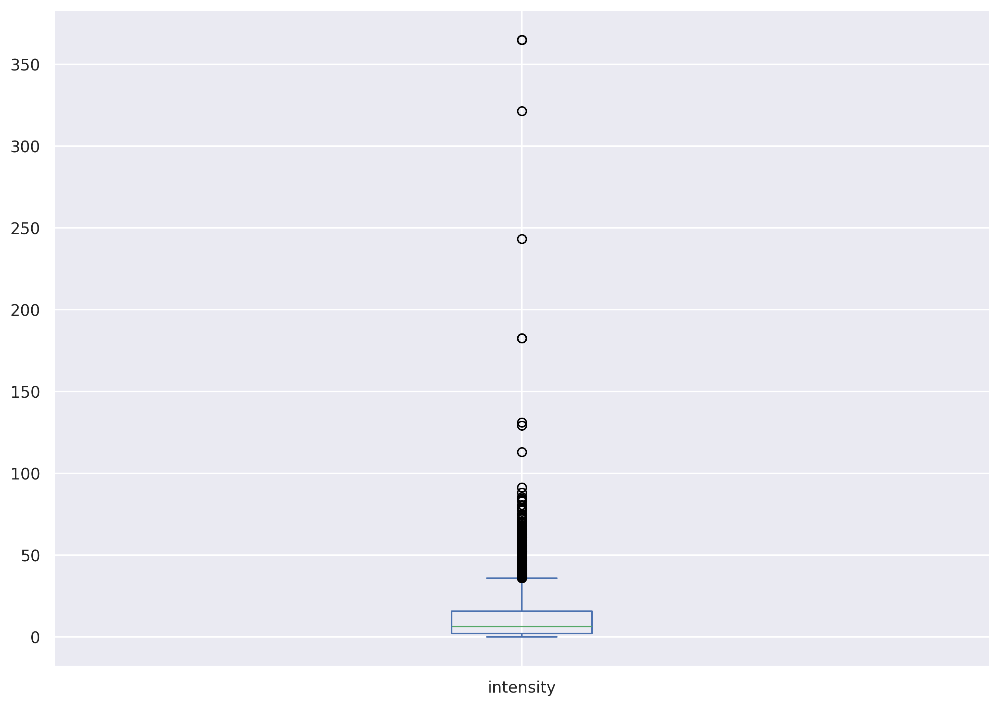

In [7]:
df_referrals_real_orig.intensity.plot(kind='box')

# Categorical Clustering

In [7]:
df_referrals_synth_rec = df_referrals_synth_orig.copy()
df_referrals_real_rec = df_referrals_real_orig.copy()

In [8]:
#df_referrals_synth_rec = df_referrals_synth_rec[~df_referrals_synth_rec.intensityGrp.isin(['high'])]
#df_referrals_real_rec = df_referrals_real_rec[~df_referrals_real_rec.intensityGrp.isin(['high'])]

In [9]:
features= ['intensityGrp',   'cond1axis1GrpLast',
       'ageGrpDesc','sexDesc']
categorical_features= ['intensityGrp',  'cond1axis1GrpLast',
       'ageGrpDesc','sexDesc']

In [10]:
df_referrals_synth_rec=df_referrals_synth_rec[features]

df_referrals_synth_rec = df_referrals_synth_rec.astype(object)
df_referrals_synth_rec.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21950 entries, 0 to 21949
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   intensityGrp       21950 non-null  object
 1   cond1axis1GrpLast  21950 non-null  object
 2   ageGrpDesc         21950 non-null  object
 3   sexDesc            21950 non-null  object
dtypes: object(4)
memory usage: 686.1+ KB


In [11]:
df_referrals_real_rec=df_referrals_real_rec[features]

df_referrals_real_rec = df_referrals_real_rec.astype(object)
df_referrals_real_rec.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4895 entries, 0 to 4894
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   intensityGrp       4895 non-null   object
 1   cond1axis1GrpLast  4895 non-null   object
 2   ageGrpDesc         4895 non-null   object
 3   sexDesc            4895 non-null   object
dtypes: object(4)
memory usage: 153.1+ KB


##

In [12]:
catColumnsPos = [df_referrals_real_rec.columns.get_loc(col) for col in categorical_features]
print('Categorical columns           : {}'.format(categorical_features))
print('Categorical columns position  : {}'.format(catColumnsPos))

Categorical columns           : ['intensityGrp', 'cond1axis1GrpLast', 'ageGrpDesc', 'sexDesc']
Categorical columns position  : [0, 1, 2, 3]


## Kmode + Haming distance

In [46]:
h_distance_matrix_s=category_distance(df_referrals_synth_rec)
h_distance_matrix_r = category_distance(df_referrals_real_rec)

In [50]:
df_referrals_synth_rec[df_referrals_synth_rec.isna().any(axis=1)]

,intensityGrp,cond1axis1GrpLast,ageGrpDesc,sexDesc


For n_clusters = 2 The average silhouette_score for real data is : 0.39761012961643233 The average silhouette_score for synthetic data is : 0.2909839562677989
For n_clusters = 3 The average silhouette_score for real data is : 0.3772144054729023 The average silhouette_score for synthetic data is : 0.2854760154247249
For n_clusters = 4 The average silhouette_score for real data is : 0.3994573802237993 The average silhouette_score for synthetic data is : 0.1695601413919411
For n_clusters = 5 The average silhouette_score for real data is : 0.2735862954110202 The average silhouette_score for synthetic data is : 0.2139350403132571
For n_clusters = 6 The average silhouette_score for real data is : 0.24027303882329956 The average silhouette_score for synthetic data is : 0.1790854311929792
For n_clusters = 7 The average silhouette_score for real data is : 0.22431953775119576 The average silhouette_score for synthetic data is : 0.14747726273841683
For n_clusters = 8 The average silhouette_score 

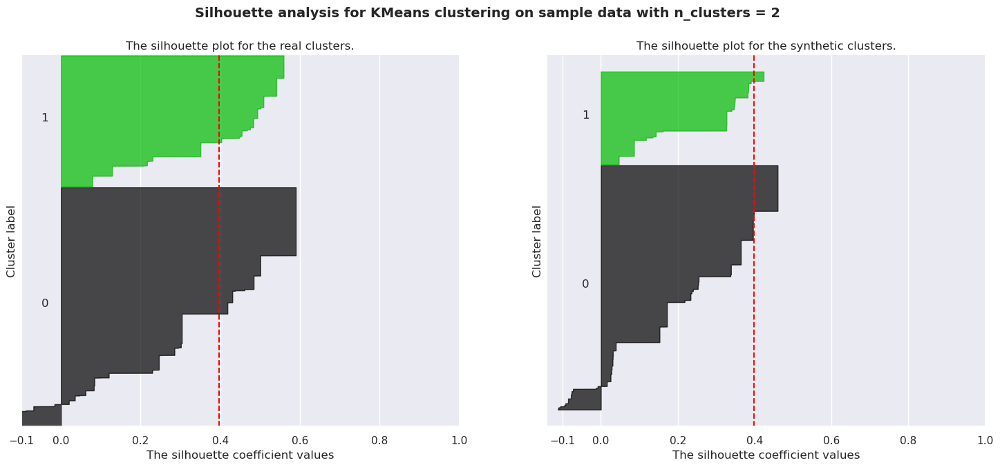

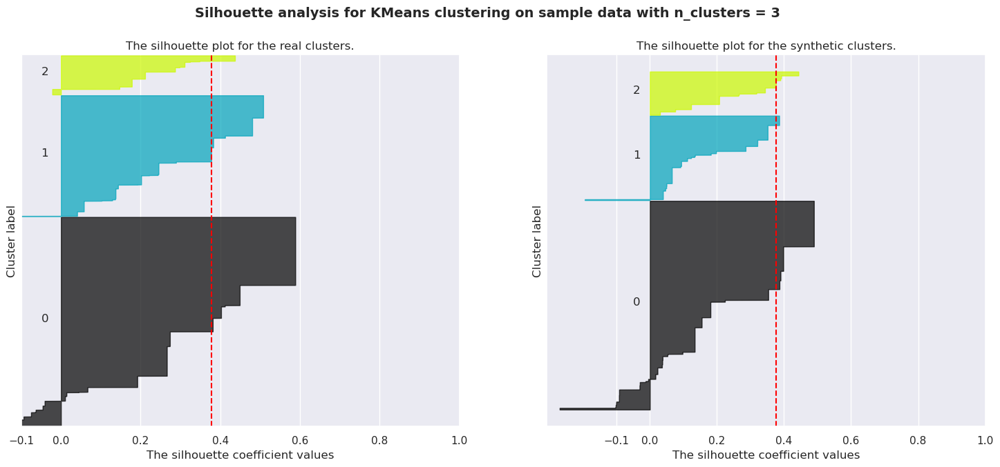

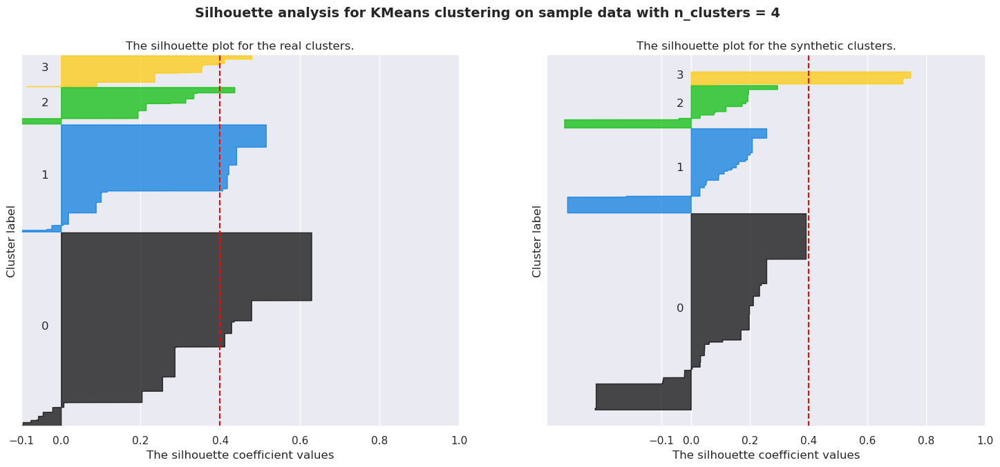

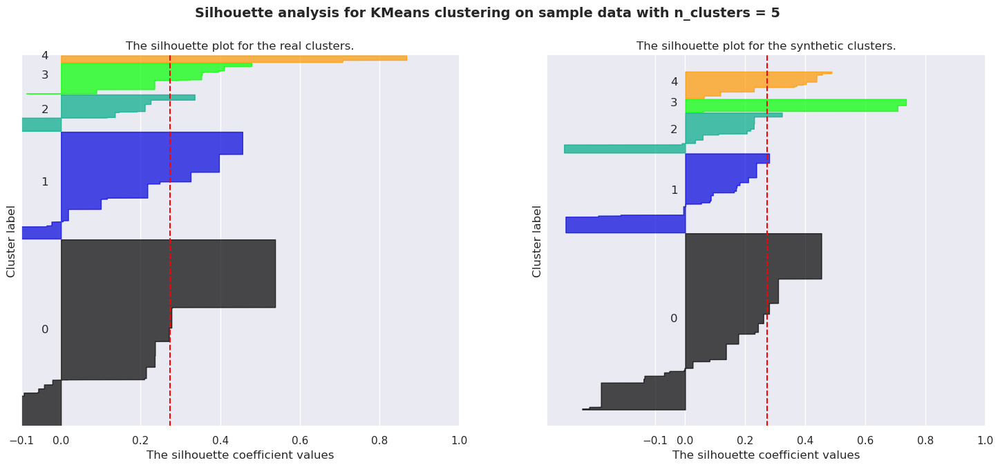

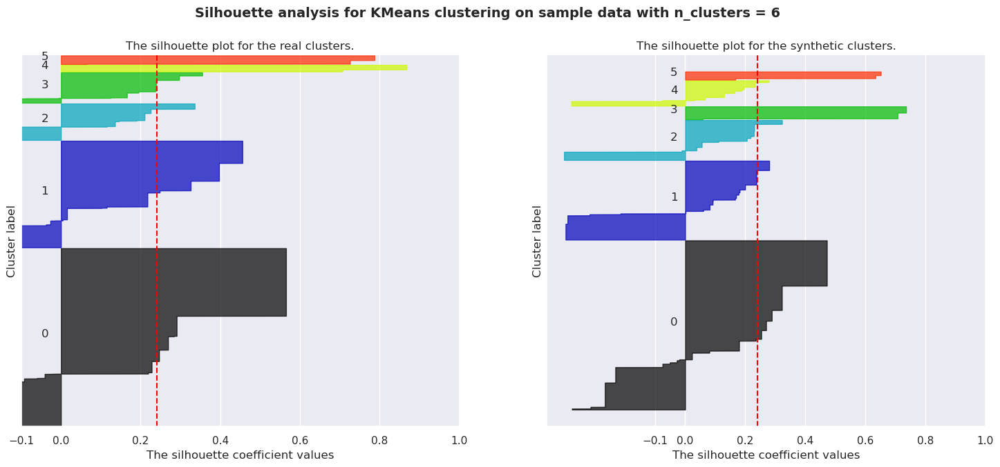

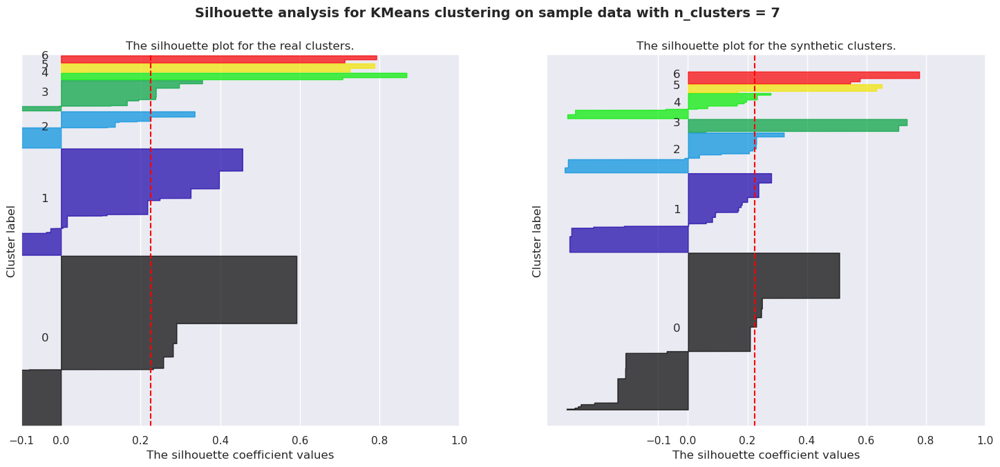

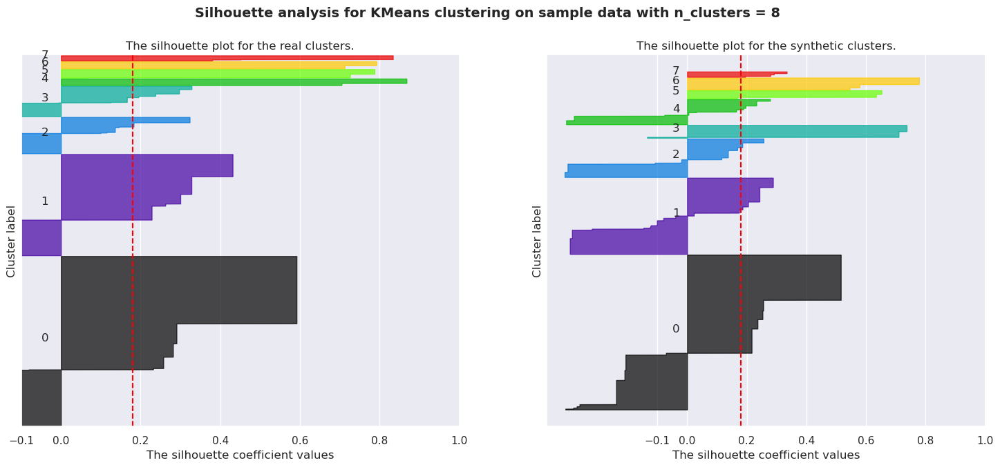

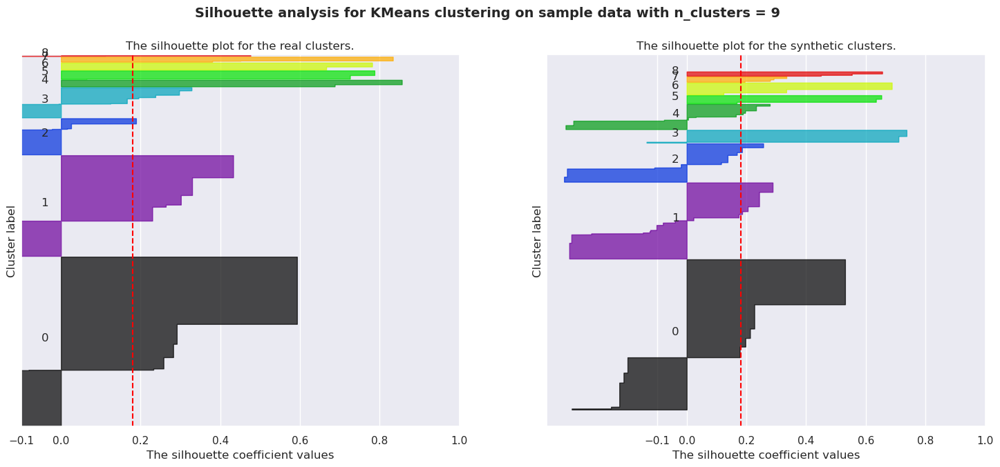

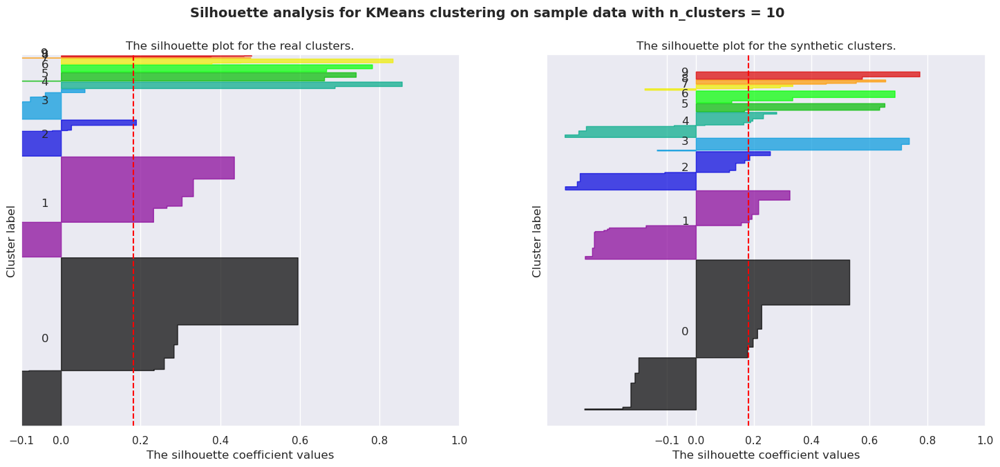

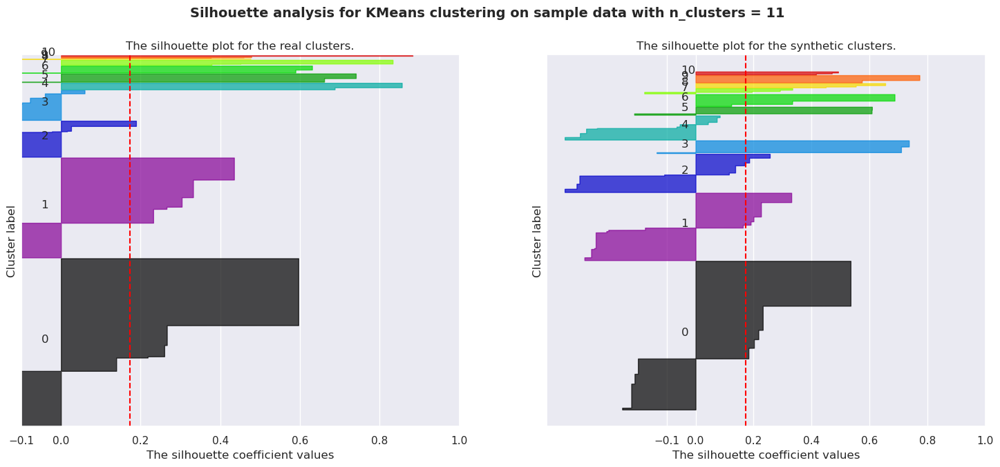

In [128]:
range_n_clusters = range(2,12)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(h_distance_matrix_r) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    
    kmode = KModes(n_clusters=n_clusters, 
                     n_jobs = 4, verbose=0, 
                     random_state=random_state)

    cluster_labels_s = kmode.fit_predict(df_referrals_synth_rec, categorical=catColumnsPos)
    cluster_labels_r = kmode.fit_predict(df_referrals_real_rec, categorical=catColumnsPos)
    
    silhouette_avg_r=silhouette_score(h_distance_matrix_r, cluster_labels_r,metric="precomputed")
    silhouette_avg_s=silhouette_score(h_distance_matrix_s, cluster_labels_s,metric="precomputed")
    

    

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score for real data is :",
        silhouette_avg_r,
         "The average silhouette_score for synthetic data is :",
        silhouette_avg_s,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values_r = silhouette_samples(h_distance_matrix_r, cluster_labels_r)
    sample_silhouette_values_s = silhouette_samples(h_distance_matrix_s, cluster_labels_s)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values_r[cluster_labels_r == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the real clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg_r, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    ### draw synthetic
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values_s[cluster_labels_s == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax2.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax2.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax2.set_title("The silhouette plot for the synthetic clusters.")
    ax2.set_xlabel("The silhouette coefficient values")
    ax2.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax2.axvline(x=silhouette_avg_r, color="red", linestyle="--")

    ax2.set_yticks([])  # Clear the yaxis labels / ticks
    ax2.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle(
        "Silhouette analysis for KMode + Hamming distance clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [129]:
kmode = KModes(n_clusters=2, 
                     n_jobs = 4, verbose=0, 
                     random_state=random_state)
clusters_s = kmode.fit_predict(df_referrals_synth_rec, categorical=catColumnsPos)
clusters_r = kmode.fit_predict(df_referrals_real_rec, categorical=catColumnsPos)

In [130]:
unique, counts = np.unique(clusters_r,return_counts=True)
print(np.asarray((unique, counts)).T)

[[   0 3160]
 [   1 1735]]


In [131]:
unique, counts = np.unique(clusters_s,return_counts=True)
print(np.asarray((unique, counts)).T)

[[   0 3622]
 [   1 1378]]


In [14]:
import functions
import importlib
importlib.reload(functions)
from functions import get_MCA_3d,plot_pca_2d

In [132]:
mca_3d, mca_3d_df = get_MCA_3d(df_referrals_synth_rec, clusters_s)
mca_3d.eigenvalues_summary



,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.316,15.79%,15.79%
1,0.261,13.06%,28.85%
2,0.257,12.83%,41.68%


In [133]:
mca_3d_r, mca_3d_df_r = get_MCA_3d(df_referrals_real_rec, clusters_r)
mca_3d_r.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.450,22.48%,22.48%
1,0.275,13.75%,36.23%
2,0.256,12.79%,49.02%


In [134]:
plot_pca_2d(mca_3d_df, title="MCA Space", opacity=1, width_line = 0.1)

In [135]:
plot_pca_2d(mca_3d_df_r, title="MCA Space", opacity=1, width_line = 0.1)

### EDA

In [144]:
df_real= df_referrals_real_orig.copy()
df_synth= df_referrals_synth_orig.copy()
df_synth['cluster']=clusters_s
df_real['cluster']=clusters_r

In [137]:
import seaborn as sns

sns.set_theme(rc={'figure.figsize':(11.7,8.27)})

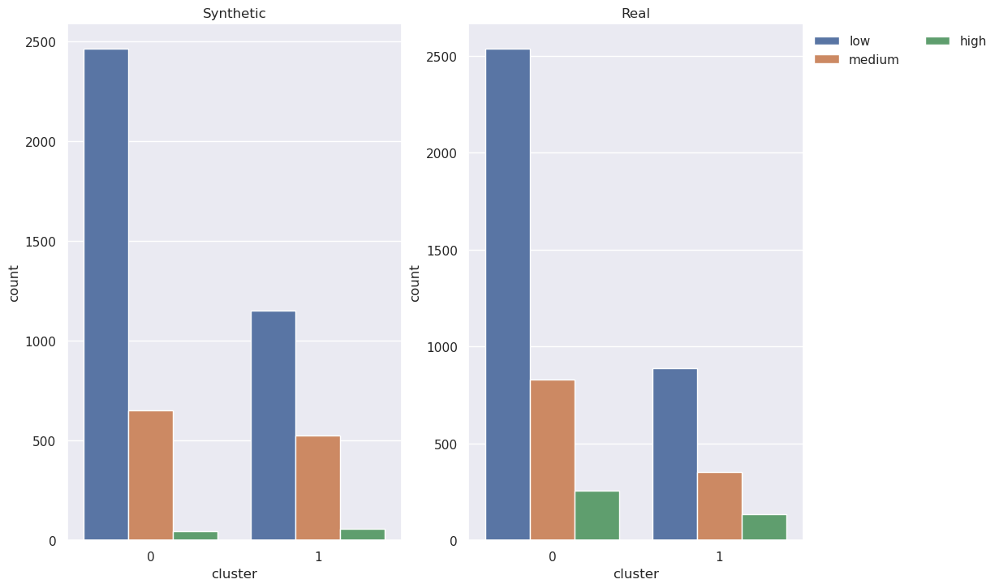

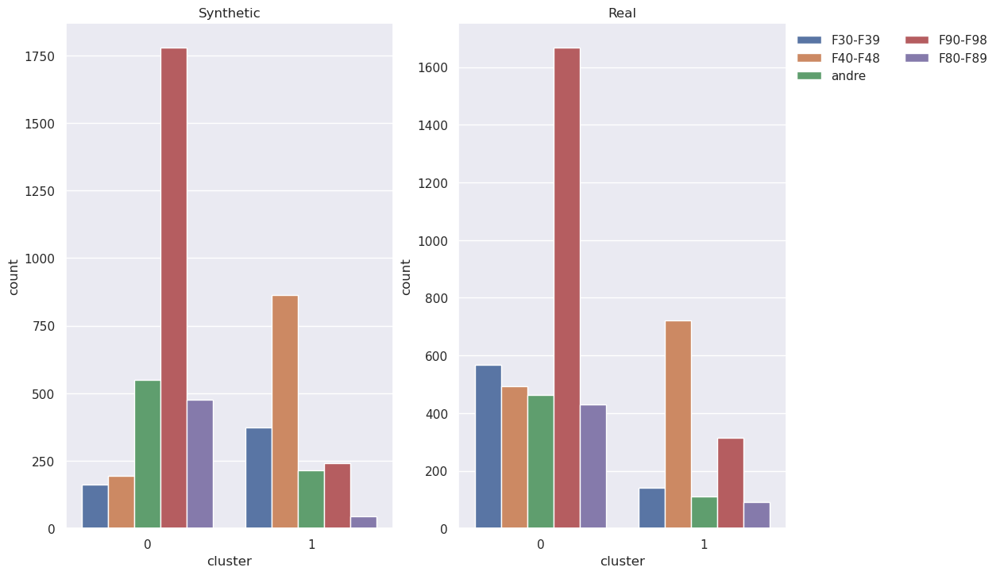

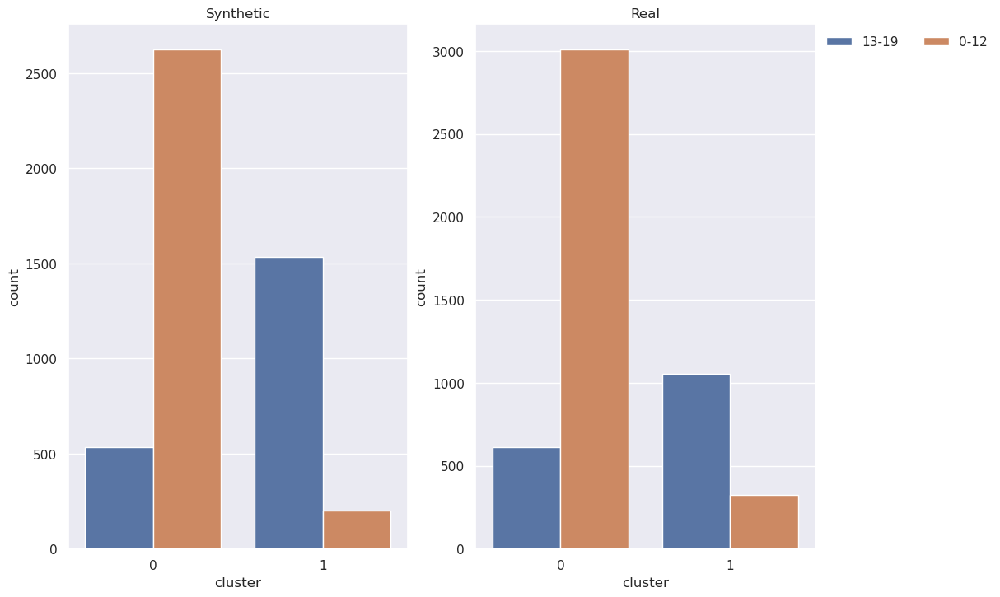

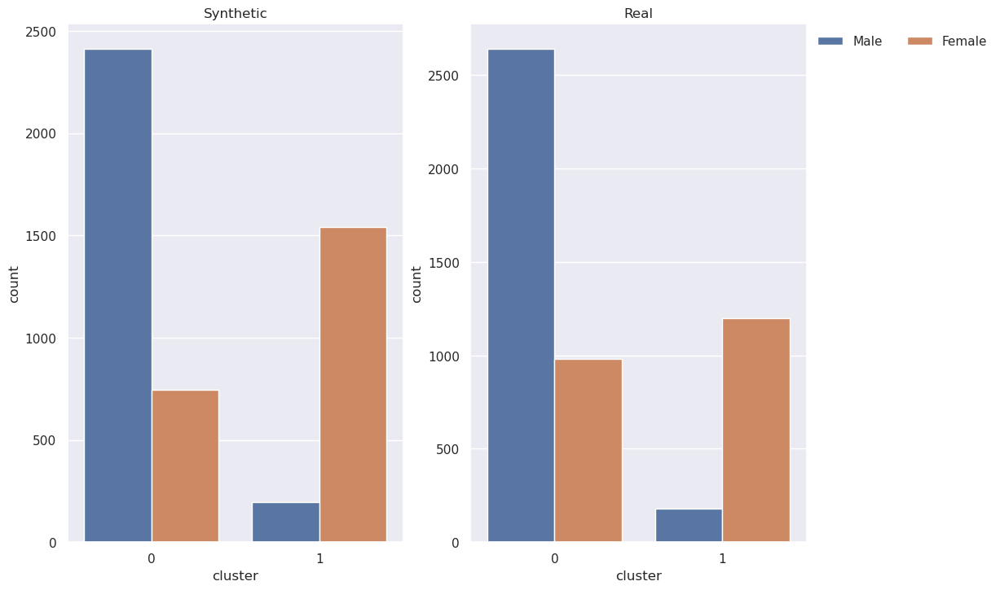

In [138]:
col='ageGrpDesc'
#fig, (ax1, ax2) = plt.subplots(len(categorical_features), 2)
#fig, ax =plt.subplots(len(categorical_features),2)
for col in categorical_features:
    #fig, ax =plt.subplots(1,2)
    i = categorical_features.index(col)
    order = df_real[col].unique().tolist()

    fig, ax =plt.subplots(1,2)
    ax1 =sns.countplot(x='cluster', hue='{}'.format(col),data=df_real,ax=ax[0],hue_order =order)
    ax1.get_legend().set_visible(False)
    ax1.set_title('Synthetic')
    ax2 =sns.countplot(x='cluster', hue='{}'.format(col), data=df_synth,ax=ax[1],hue_order = order)
    ax2.set_title('Real')
    #ax1.set_xlabel('')
    #ax2.set_xlabel('')
    sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1), ncol=2, title=None, frameon=False)
plt.subplots_adjust(hspace = 0.1)
fig.show()

In [149]:
import functions
import importlib
importlib.reload(functions)
from functions import cluster_profile_cat

df_synth['cond1axis1Grp_1']=df_synth['cond1axis1GrpLast']

df_real['cond1axis1Grp_1']=df_real['cond1axis1GrpLast']

cluster_profile_cat(df_synth)

,sexDesc,ageGrpDesc,intensityGrp,intensity,cond1axis1Grp_1
cluster,,,,,
0,Male,0-12,low,8.488372,F90-F98
1,Female,13-19,low,9.760382,F40-F48


In [150]:

cluster_profile_cat(df_real)

,sexDesc,ageGrpDesc,intensityGrp,intensity,cond1axis1Grp_1
cluster,,,,,
0,Male,0-12,low,5.156584,F90-F98
1,Female,13-19,low,8.742515,F40-F48


### Classification of the labels

In [153]:
features =[
       'intensityGrp', 
     'cond1axis1GrpLast', 'ageGrpDesc','sexDesc'
       ]
categorical_features=features


lgbm_real_data= df_referrals_real_rec.copy()
lgbm_synth_data= df_referrals_synth_rec.copy()

lgbm_synth_data[categorical_features] = lgbm_synth_data[categorical_features].astype('category')
lgbm_real_data[categorical_features] = lgbm_real_data[categorical_features].astype('category')
target_synth = clusters_s
target_real = clusters_r
lgbm_synth_data=lgbm_synth_data[features]  
lgbm_real_data=lgbm_real_data[features]  


#KMeans clusters
clf_kp = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
cv_scores_r = cross_val_score(clf_kp, lgbm_real_data, clusters_r, scoring='f1_weighted')




cv_scores_s = cross_val_score(clf_kp, lgbm_synth_data, clusters_s, scoring='f1_weighted')








[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 1388, number of negative: 2528
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16
[LightGBM] [Info] Number of data points in the train set: 3916, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.354443 -> initscore=-0.599565
[LightGBM] [Info] Start training from score -0.599565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [154]:
print(f'CV F1 score for K-Means real clusters is {np.mean(cv_scores_r)}')
print(f'CV F1 score for K-Means synthetic clusters is {np.mean(cv_scores_s)}')


CV F1 score for K-Means real clusters is 1.0
CV F1 score for K-Means synthetic clusters is 1.0


[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 1735, number of negative: 3160
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16
[LightGBM] [Info] Number of data points in the train set: 4895, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.354443 -> initscore=-0.599565
[LightGBM] [Info] Start training from score -0.599565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray

/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

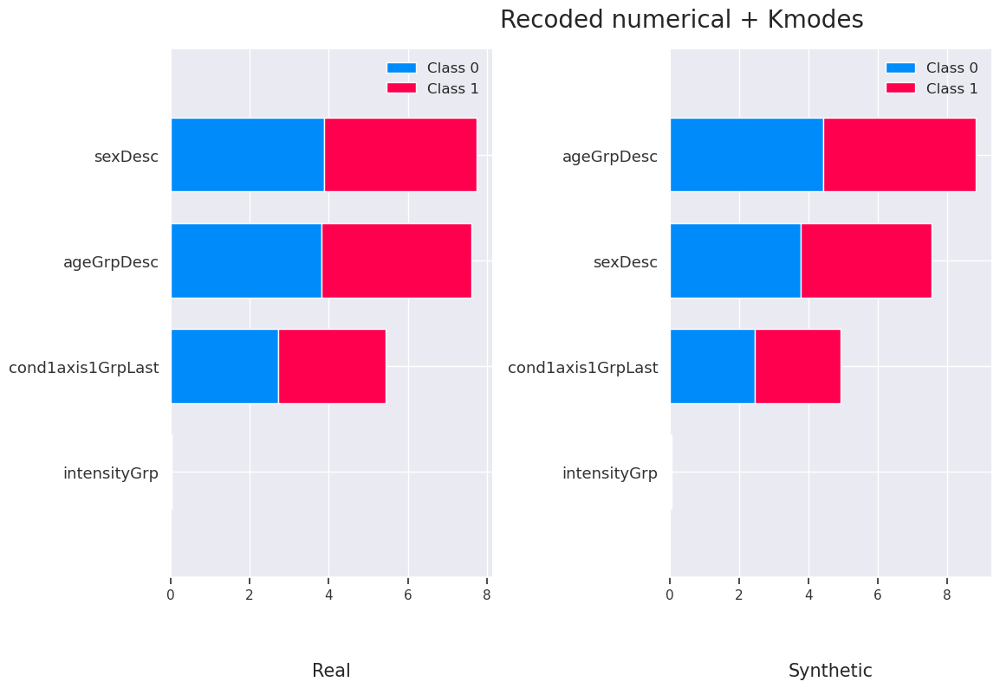

In [155]:
clf_r = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_r.fit(lgbm_real_data,  target_real)
explainer_kp = shap.TreeExplainer(clf_r)
shap_values_s = explainer_kp.shap_values(lgbm_real_data)

clf_s = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_s.fit(lgbm_synth_data,  target_synth)
explainer_kp = shap.TreeExplainer(clf_s)
shap_values_r = explainer_kp.shap_values(lgbm_synth_data)



plt.subplot(1,2,1)
fig, ax = plt.gcf(), plt.gca()
fig.suptitle('Recoded numerical + Kmodes', fontsize=20,horizontalalignment='left')
shap.summary_plot(shap_values_r ,lgbm_real_data, plot_size=None, plot_type="bar",show=False)
fig, ax = plt.gcf(), plt.gca()
ax.set_xlabel('')


plt.title("Real", y=-0.2,fontsize = 15)

plt.subplot(1,2,2)
shap.summary_plot(shap_values_s, lgbm_synth_data, plot_size=None, plot_type="bar",show=False)
fig, ax = plt.gcf(), plt.gca()
ax.set_xlabel('')
plt.title("Synthetic", y=-0.2,fontsize = 15)
#plt.legend('',frameon=False)
#plt.tight_layout()

plt.show()

## Graph Analysis Community Detection

In [156]:
import functions
import importlib
importlib.reload(functions)
from functions import convert_df_to_graph_network,convert_community_output_to_df,merge_clusters_back_df
from community import community_louvain

In [157]:
df_referrals_synth_rec.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5000 entries, 18488 to 9810
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   intensityGrp       5000 non-null   object
 1   cond1axis1GrpLast  5000 non-null   object
 2   ageGrpDesc         5000 non-null   object
 3   sexDesc            5000 non-null   object
dtypes: object(4)
memory usage: 195.3+ KB


In [158]:
graph_synth = convert_df_to_graph_network(df_referrals_synth_rec)
graph_real = convert_df_to_graph_network(df_referrals_real_rec)

In [159]:

communities_dict = community_louvain.best_partition(graph_synth)
communites, features = convert_community_output_to_df(communities_dict)
graph_comunities_synth = merge_clusters_back_df(df_referrals_synth_rec, communites)

In [160]:

communities_dict = community_louvain.best_partition(graph_real)
communites, features = convert_community_output_to_df(communities_dict)
graph_comunities_real = merge_clusters_back_df(df_referrals_real_rec, communites)

In [161]:
mca_3d_s, mca_3d_df_s = get_MCA_3d(graph_comunities_synth, graph_comunities_synth.Clusters)
mca_3d_s.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.398,15.29%,15.29%
1,0.388,14.93%,30.22%
2,0.370,14.24%,44.46%


In [162]:
mca_3d_r, mca_3d_df_r = get_MCA_3d(graph_comunities_real, graph_comunities_real.Clusters)
mca_3d_r.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.495,20.64%,20.64%
1,0.404,16.84%,37.48%
2,0.364,15.17%,52.64%


In [163]:
plot_pca_2d(mca_3d_df_s, title="MCA Space Synthetic", opacity=1, width_line = 0.1)

In [164]:
plot_pca_2d(mca_3d_df_r, title="MCA Space Real", opacity=1, width_line = 0.1)

### EDA

In [168]:
df_synth = df_referrals_synth_orig.copy()
df_real = df_referrals_real_orig.copy()
clusters_s= graph_comunities_synth.Clusters
clusters_r =graph_comunities_real.Clusters

df_synth['cluster'] = clusters_s

df_real['cluster'] = clusters_r


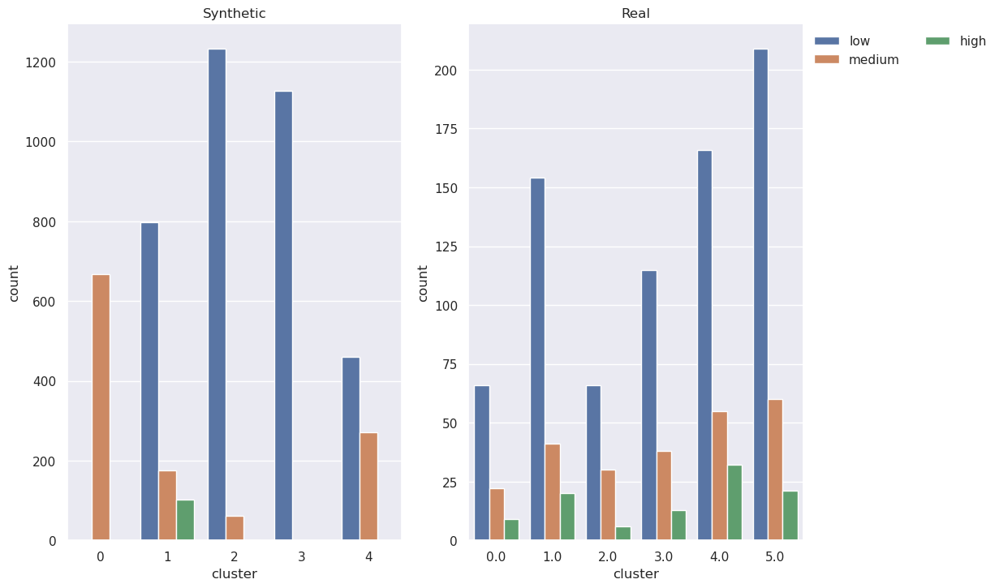

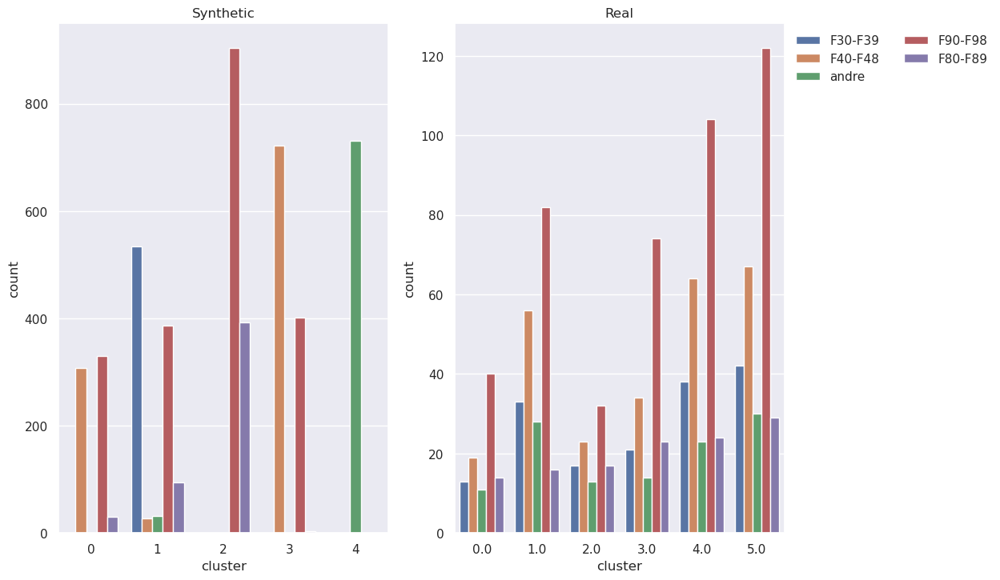

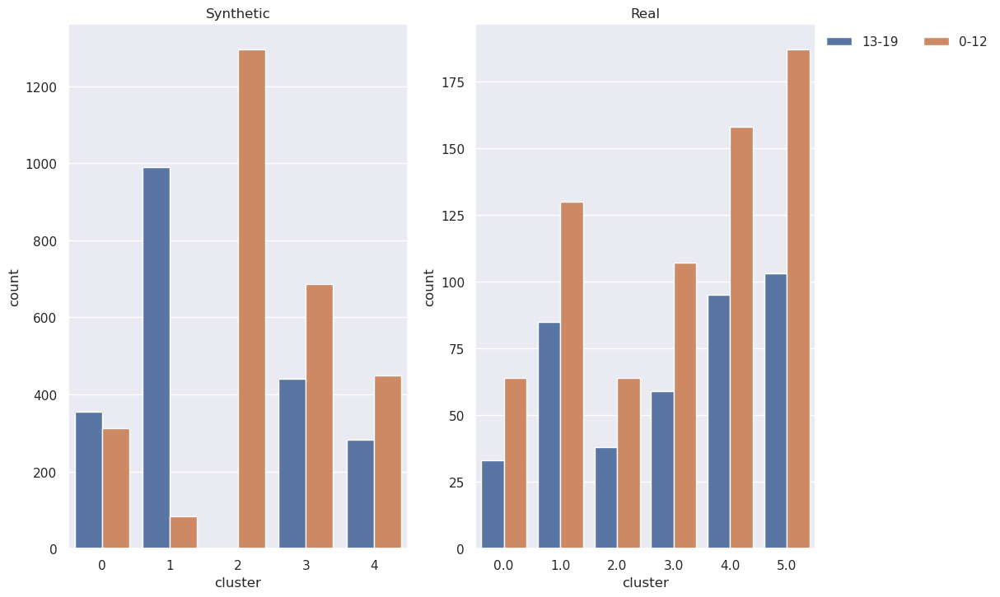

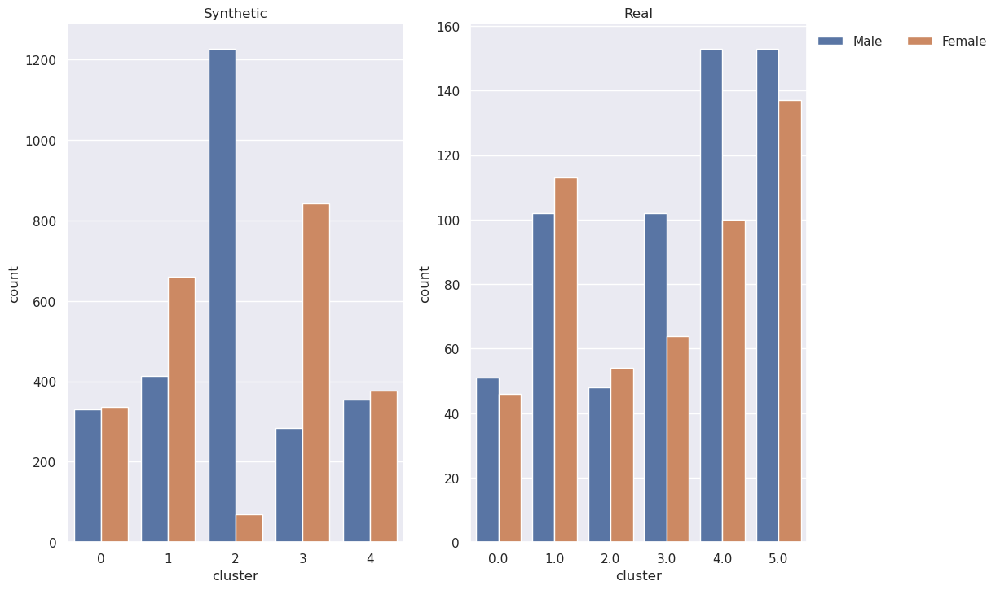

In [169]:
col='ageGrpDesc'
#fig, (ax1, ax2) = plt.subplots(len(categorical_features), 2)
#fig, ax =plt.subplots(len(categorical_features),2)
for col in categorical_features:
    #fig, ax =plt.subplots(1,2)
    i = categorical_features.index(col)
    order = df_real[col].unique().tolist()

    fig, ax =plt.subplots(1,2)
    ax1 =sns.countplot(x='cluster', hue='{}'.format(col),data=df_real,ax=ax[0],hue_order =order)
    ax1.get_legend().set_visible(False)
    ax1.set_title('Synthetic')
    ax2 =sns.countplot(x='cluster', hue='{}'.format(col), data=df_synth,ax=ax[1],hue_order = order)
    ax2.set_title('Real')
    #ax1.set_xlabel('')
    #ax2.set_xlabel('')
    sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1), ncol=2, title=None, frameon=False)
plt.subplots_adjust(hspace = 0.1)
fig.show()

In [170]:
import functions
import importlib
importlib.reload(functions)
from functions import cluster_profile_cat

df_synth['cond1axis1Grp_1']=df_synth['cond1axis1GrpLast']

df_real['cond1axis1Grp_1']=df_real['cond1axis1GrpLast']

cluster_profile_cat(df_synth)


,sexDesc,ageGrpDesc,intensityGrp,intensity,cond1axis1Grp_1
cluster,,,,,
0.0,Male,0-12,low,8.902439,F90-F98
1.0,Female,0-12,low,6.915789,F90-F98
2.0,Female,0-12,low,10.077958,F90-F98
3.0,Male,0-12,low,9.536584,F90-F98
4.0,Male,0-12,low,8.996479,F90-F98
5.0,Male,0-12,low,8.752584,F90-F98


In [171]:
cluster_profile_cat(df_real)

,sexDesc,ageGrpDesc,intensityGrp,intensity,cond1axis1Grp_1
cluster,,,,,
0,Female,13-19,medium,22.421224,F90-F98
1,Female,13-19,low,6.880308,F30-F39
2,Male,0-12,low,3.130968,F90-F98
3,Female,0-12,low,4.023887,F40-F48
4,Female,0-12,low,9.605263,andre


### Classification

In [27]:
features =[
       'intensityGrp', 
       'cond1axis1GrpLast', 'ageGrpDesc','sexDesc'
       ]
categorical_features=features


lgbm_real_data= df_referrals_real_rec.copy()
lgbm_synth_data= df_referrals_synth_rec.copy()

lgbm_synth_data[categorical_features] = lgbm_synth_data[categorical_features].astype('category')
lgbm_real_data[categorical_features] = lgbm_real_data[categorical_features].astype('category')
target_synth = clusters_s
target_real = clusters_r
lgbm_synth_data=lgbm_synth_data[features]  
lgbm_real_data=lgbm_real_data[features]  


#KMeans clusters
clf_kp = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
cv_scores_r = cross_val_score(clf_kp, lgbm_real_data, clusters_r, scoring='f1_weighted')




cv_scores_s = cross_val_score(clf_kp, lgbm_synth_data, clusters_s, scoring='f1_weighted')

[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 1388, number of negative: 2528
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 16
[LightGBM] [Info] Number of data points in the train set: 3916, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.354443 -> initscore=-0.599565
[LightGBM] [Info] Start training from score -0.599565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [28]:


print(f'CV F1 score for K-Means real clusters is {np.mean(cv_scores_r)}')
print(f'CV F1 score for K-Means synthetic clusters is {np.mean(cv_scores_s)}')

CV F1 score for K-Means real clusters is 1.0
CV F1 score for K-Means synthetic clusters is 1.0


In [29]:
clf_r = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_r.fit(lgbm_real_data,  target_real)
explainer_kp = shap.TreeExplainer(clf_r)
shap_values_s = explainer_kp.shap_values(lgbm_real_data)

clf_s = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_s.fit(lgbm_synth_data,  target_synth)
explainer_kp = shap.TreeExplainer(clf_s)
shap_values_r = explainer_kp.shap_values(lgbm_synth_data)


[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 1735, number of negative: 3160
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16
[LightGBM] [Info] Number of data points in the train set: 4895, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.354443 -> initscore=-0.599565
[LightGBM] [Info] Start training from score -0.599565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray

/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 1735, number of negative: 3160
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16
[LightGBM] [Info] Number of data points in the train set: 4895, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.354443 -> initscore=-0.599565
[LightGBM] [Info] Start training from score -0.599565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray

/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



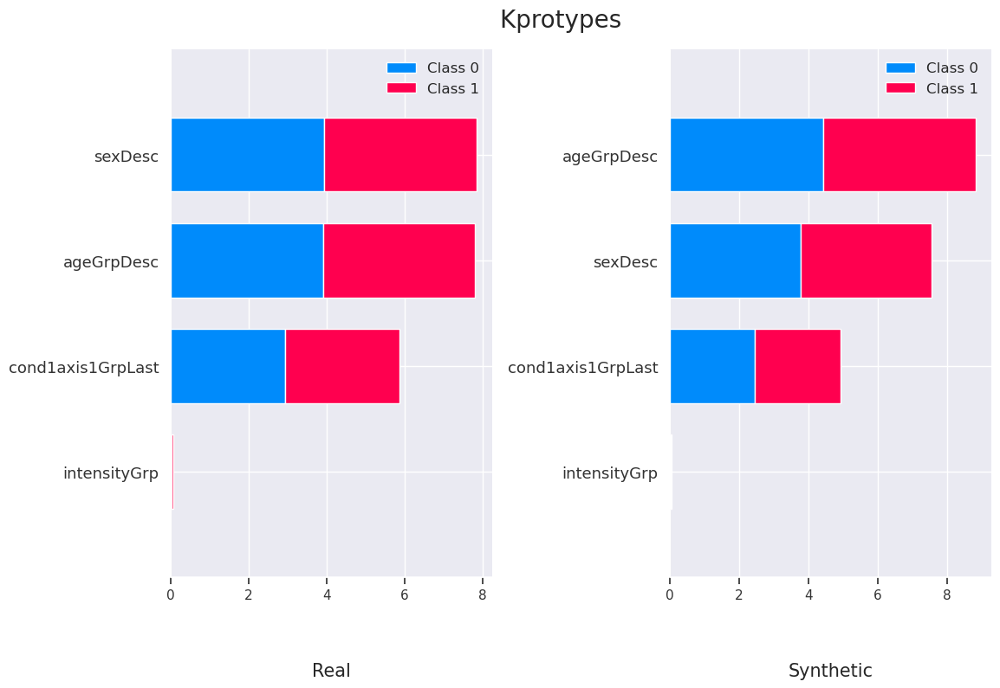

In [30]:
clf_r = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_r.fit(lgbm_real_data,  target_real)
explainer_kp = shap.TreeExplainer(clf_r)
shap_values_s = explainer_kp.shap_values(lgbm_real_data)

clf_s = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_s.fit(lgbm_synth_data,  target_synth)
explainer_kp = shap.TreeExplainer(clf_s)
shap_values_r = explainer_kp.shap_values(lgbm_synth_data)



plt.subplot(1,2,1)
fig, ax = plt.gcf(), plt.gca()
fig.suptitle('Kprotypes ', fontsize=20,horizontalalignment='left')
shap.summary_plot(shap_values_r ,lgbm_real_data, plot_size=None, plot_type="bar",show=False)
fig, ax = plt.gcf(), plt.gca()
ax.set_xlabel('')


plt.title("Real", y=-0.2,fontsize = 15)

plt.subplot(1,2,2)
shap.summary_plot(shap_values_s, lgbm_synth_data, plot_size=None, plot_type="bar",show=False)
fig, ax = plt.gcf(), plt.gca()
ax.set_xlabel('')
plt.title("Synthetic", y=-0.2,fontsize = 15)
#plt.legend('',frameon=False)
#plt.tight_layout()

plt.show()

## Method 3: LLM + Kmeans

In [172]:
df_referrals_synth_rec.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5000 entries, 18488 to 9810
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   intensityGrp       5000 non-null   object
 1   cond1axis1GrpLast  5000 non-null   object
 2   ageGrpDesc         5000 non-null   object
 3   sexDesc            5000 non-null   object
dtypes: object(4)
memory usage: 195.3+ KB


In [173]:
from sentence_transformers import SentenceTransformer


# referralLength: {x['referralLength_cat']}, 


# -------------------- First Step --------------------
def compile_text(x):

    text =  f"""age: {x['ageGrpDesc']}, 
                
                number of episodes: {x['intensityGrp']}, 
                Primary Diagnosis: {x['cond1axis1GrpLast']},
                sex: {x['sexDesc']} 
              
            """

    return text

sentences_s = df_referrals_synth_rec.apply(lambda x: compile_text(x), axis=1).tolist()
sentences_r = df_referrals_real_rec.apply(lambda x: compile_text(x), axis=1).tolist()

# -------------------- Second Step --------------------

model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2")
output_s = model.encode(sentences=sentences_s,
         show_progress_bar=True,
         normalize_embeddings=True)
output_r = model.encode(sentences=sentences_r,
         show_progress_bar=True,
         normalize_embeddings=True)

df_embedding_s = pd.DataFrame(output_s)
df_embedding_r = pd.DataFrame(output_r)


/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning:

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.

Batches: 100%|██████████| 153/153 [00:00<00:00, 188.05it/s]


### outliers

In [174]:
from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod

clf = ECOD()
clf.fit(df_embedding_s)


out = clf.predict(df_embedding_s) 
df_embedding_s["outliers"] = out
df_referrals_synth_rec["outliers"] = out

df_embedding_no_out_s = df_embedding_s[df_embedding_s["outliers"] == 0]
df_embedding_no_out_s = df_embedding_no_out_s.drop(["outliers"], axis = 1)


df_embedding_with_out_s = df_embedding_s.copy()
df_embedding_with_out_s = df_embedding_with_out_s.drop(["outliers"], axis = 1)


clf.fit(df_embedding_r)


out = clf.predict(df_embedding_r) 
df_embedding_r["outliers"] = out
df_referrals_real_rec["outliers"] = out

df_embedding_no_out_r = df_embedding_r[df_embedding_r["outliers"] == 0]
df_embedding_no_out_r = df_embedding_no_out_r.drop(["outliers"], axis = 1)


df_embedding_with_out_r = df_embedding_r.copy()
df_embedding_with_out_r = df_embedding_with_out_r.drop(["outliers"], axis = 1)

In [175]:
df_embedding_no_out_s.shape

(4521, 384)

In [176]:
df_embedding_with_out_s.shape

(5000, 384)

In [177]:
df_embedding_no_out_r.shape

(4543, 384)

In [178]:
df_embedding_with_out_r.shape

(4895, 384)

For n_clusters = 2 The average silhouette_score for real data is : 0.50202876 The average silhouette_score for synthetic data is : 0.49324653
For n_clusters = 3 The average silhouette_score for real data is : 0.4783273 The average silhouette_score for synthetic data is : 0.43128917
For n_clusters = 4 The average silhouette_score for real data is : 0.48083523 The average silhouette_score for synthetic data is : 0.43132657
For n_clusters = 5 The average silhouette_score for real data is : 0.5312168 The average silhouette_score for synthetic data is : 0.46851596
For n_clusters = 6 The average silhouette_score for real data is : 0.5296926 The average silhouette_score for synthetic data is : 0.46520948
For n_clusters = 7 The average silhouette_score for real data is : 0.5434825 The average silhouette_score for synthetic data is : 0.46064916
For n_clusters = 8 The average silhouette_score for real data is : 0.52459574 The average silhouette_score for synthetic data is : 0.47753075
For n_clus

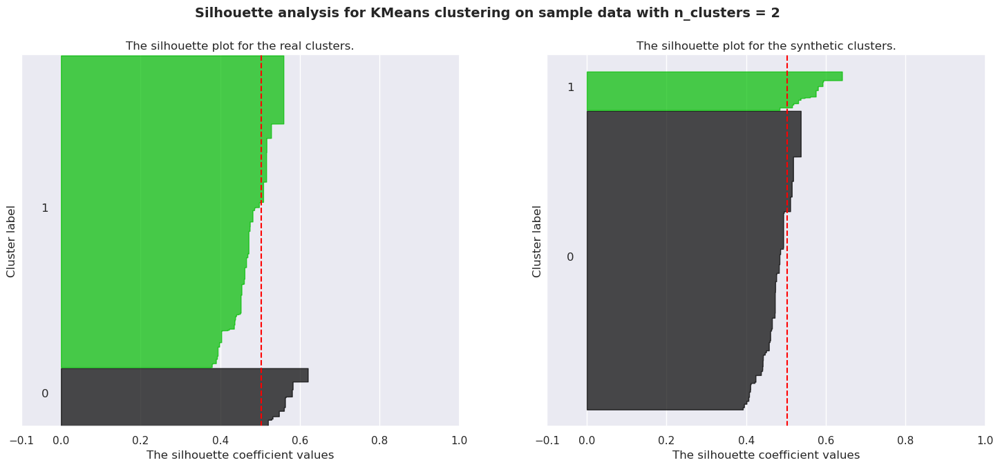

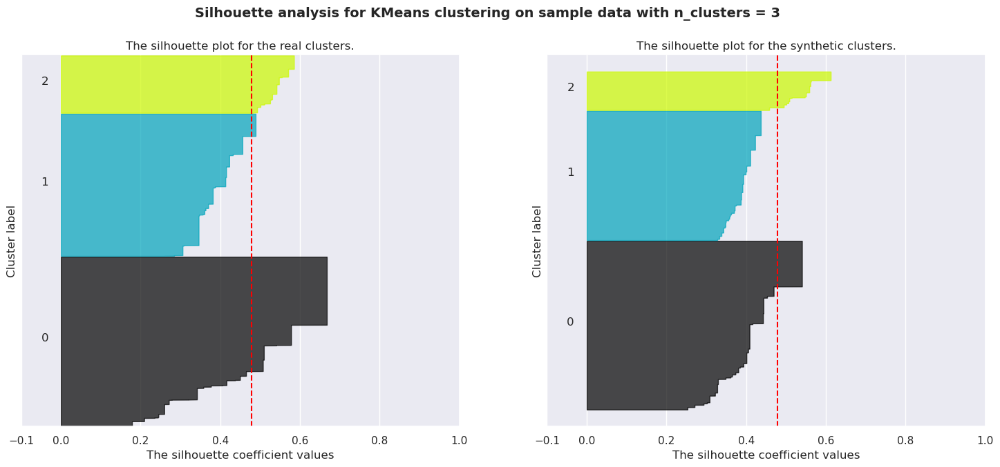

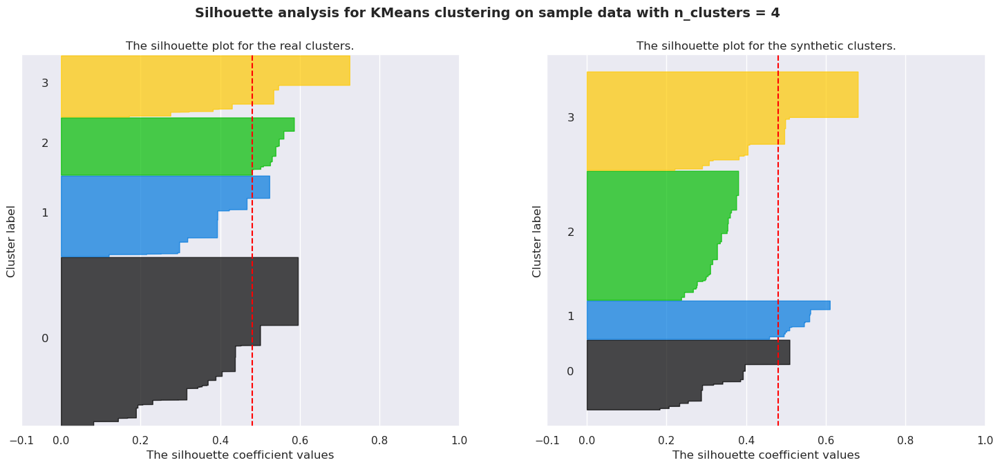

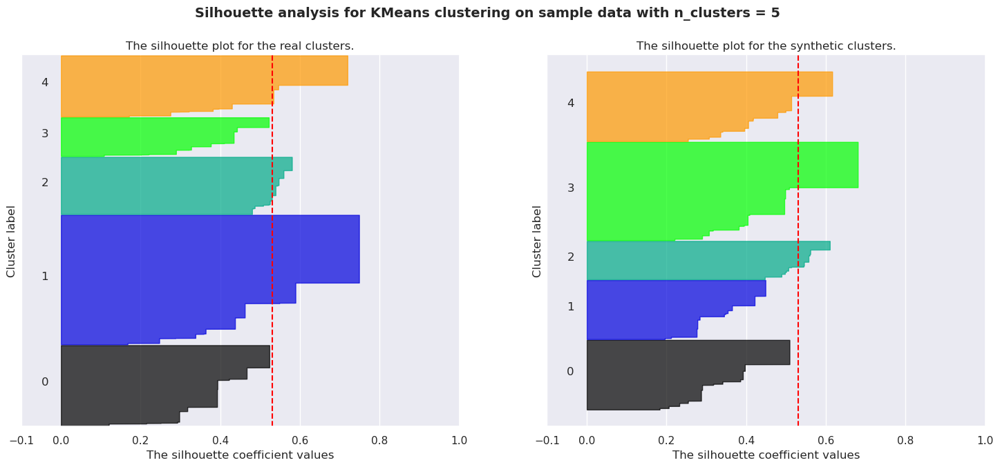

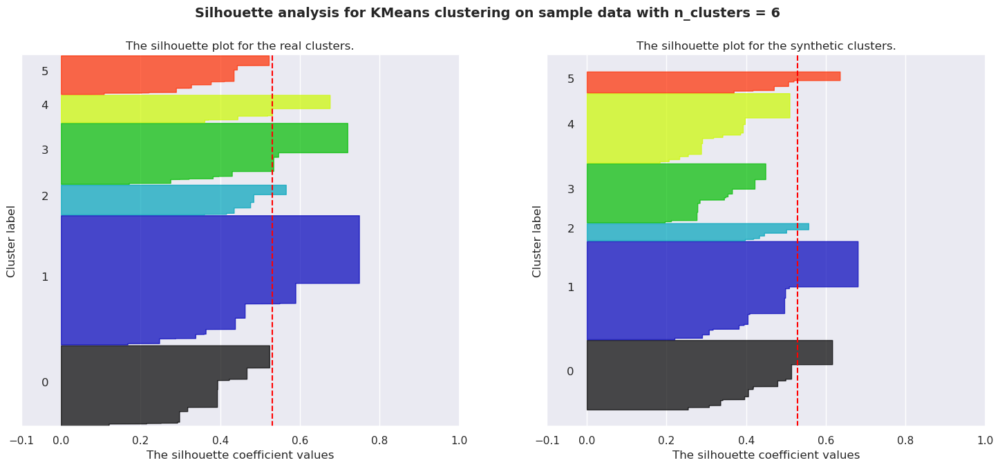

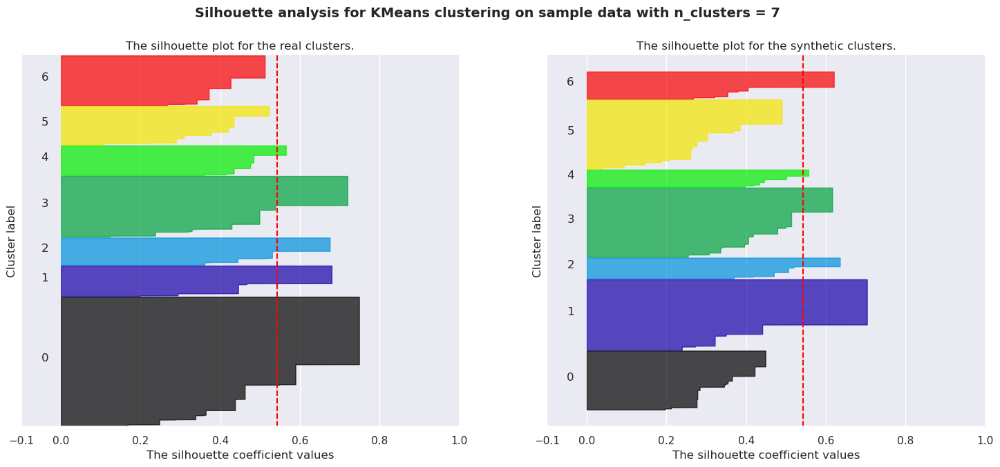

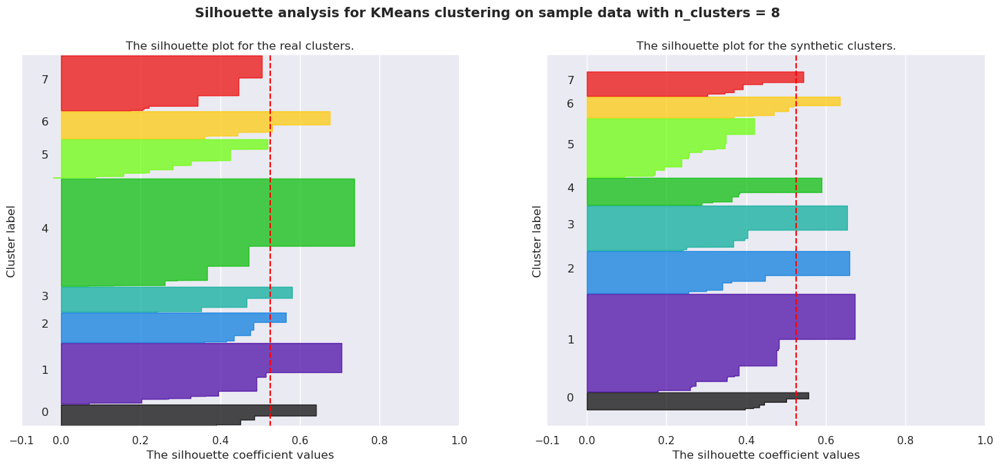

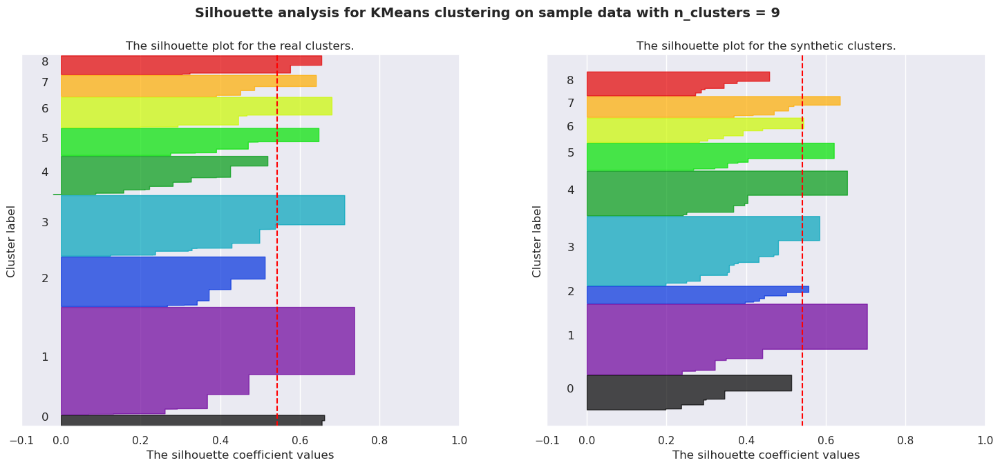

In [179]:
range_n_clusters = range(2,10)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_embedding_with_out_r) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    
    kmean = KMeans(n_clusters=n_clusters, init = "k-means++", max_iter = 1000, n_init = 10)

    cluster_labels_s = kmean.fit_predict(df_embedding_with_out_s )
    cluster_labels_r = kmean.fit_predict(df_embedding_with_out_r)

    
    silhouette_avg_r=silhouette_score(df_embedding_with_out_r, cluster_labels_r)
    silhouette_avg_s=silhouette_score(df_embedding_with_out_s, cluster_labels_s)
    

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score for real data is :",
        silhouette_avg_r,
         "The average silhouette_score for synthetic data is :",
        silhouette_avg_s,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values_r = silhouette_samples(df_embedding_with_out_r, cluster_labels_r)
    sample_silhouette_values_s = silhouette_samples(df_embedding_with_out_s, cluster_labels_s)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values_r[cluster_labels_r == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the real clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg_r, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    ### draw synthetic
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values_s[cluster_labels_s == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax2.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax2.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax2.set_title("The silhouette plot for the synthetic clusters.")
    ax2.set_xlabel("The silhouette coefficient values")
    ax2.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax2.axvline(x=silhouette_avg_r, color="red", linestyle="--")

    ax2.set_yticks([])  # Clear the yaxis labels / ticks
    ax2.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [180]:
kmean = KMeans(n_clusters=2, init = "k-means++", max_iter = 1000, n_init = 10)

clusters_s = kmean.fit_predict(df_embedding_with_out_s )
clusters_r = kmean.fit_predict(df_embedding_with_out_r)

In [184]:
pca_3d_object, df_pca_3d = get_pca_2d(df_embedding_with_out_s, clusters_s)
fig = plot_pca_2d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)
fig.show()

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            118.582        30.88%                     30.88%
1             97.150        25.30%                     56.18%


In [185]:
pca_3d_object, df_pca_3d = get_pca_2d(df_embedding_with_out_r, clusters_r)
fig = plot_pca_2d(df_pca_3d, title = "PCA Space", opacity=.2, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)
fig.show()

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            132.267        34.44%                     34.44%
1            107.100        27.89%                     62.34%


In [ ]:
df_real=df_referrals_real_orig#[df_referrals_real_rec["outliers"]==0]
df_synth=df_referrals_synth_rec#[df_referrals_synth_rec["outliers"]==0]
#df_synth= df_referrals_synth_rec.copy()
df_synth['cluster']=clusters_s
df_real['cluster']=clusters_r

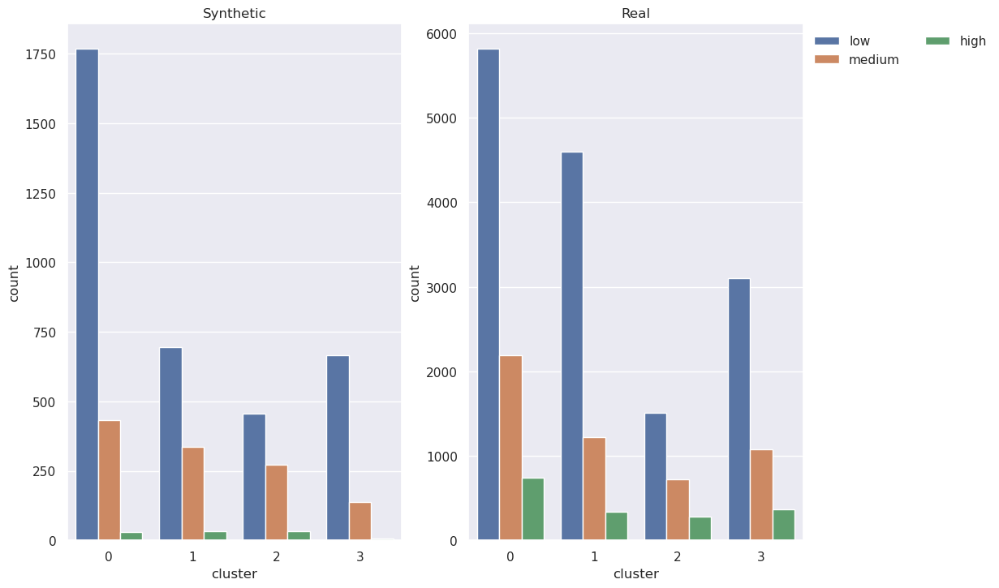

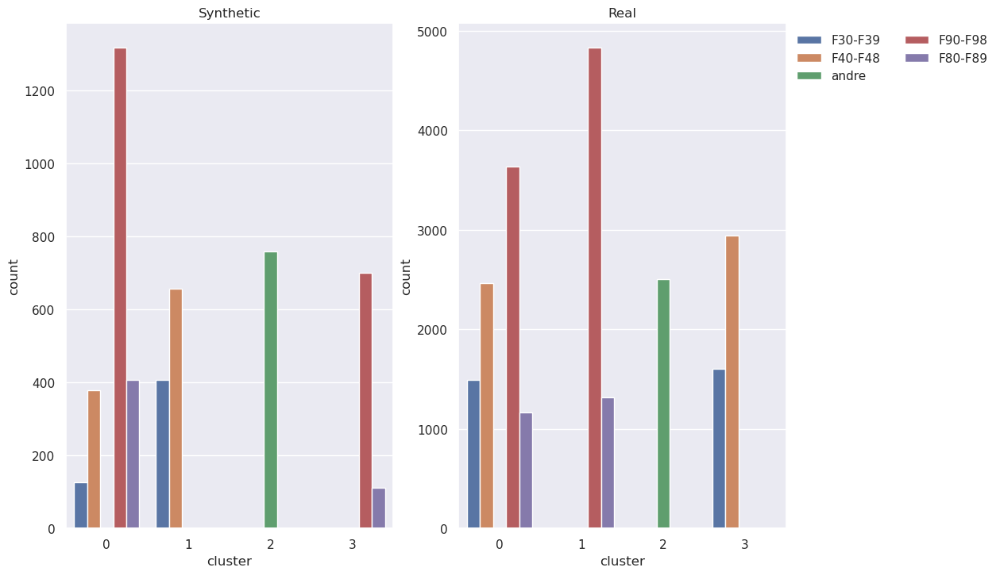

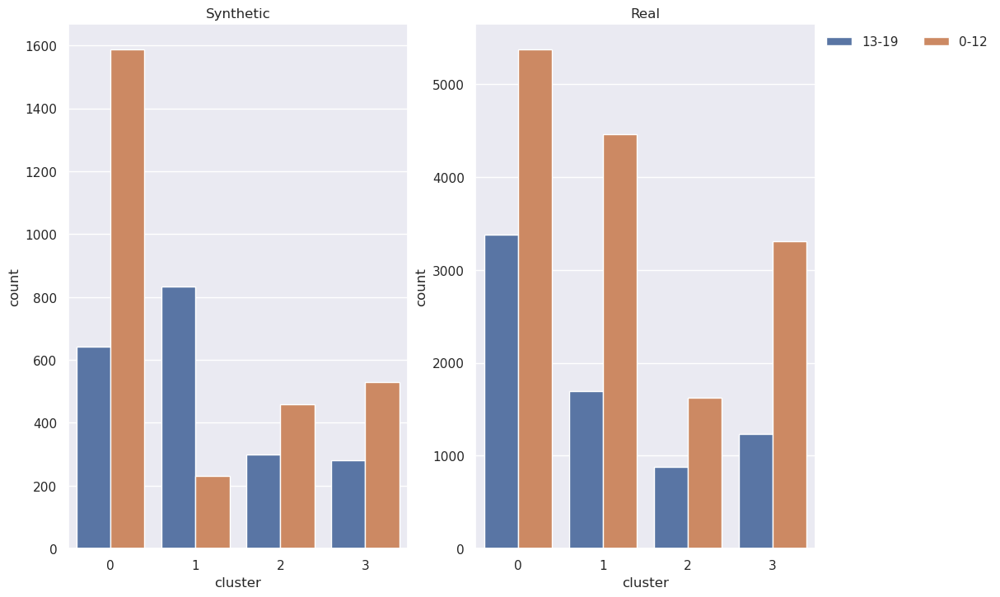

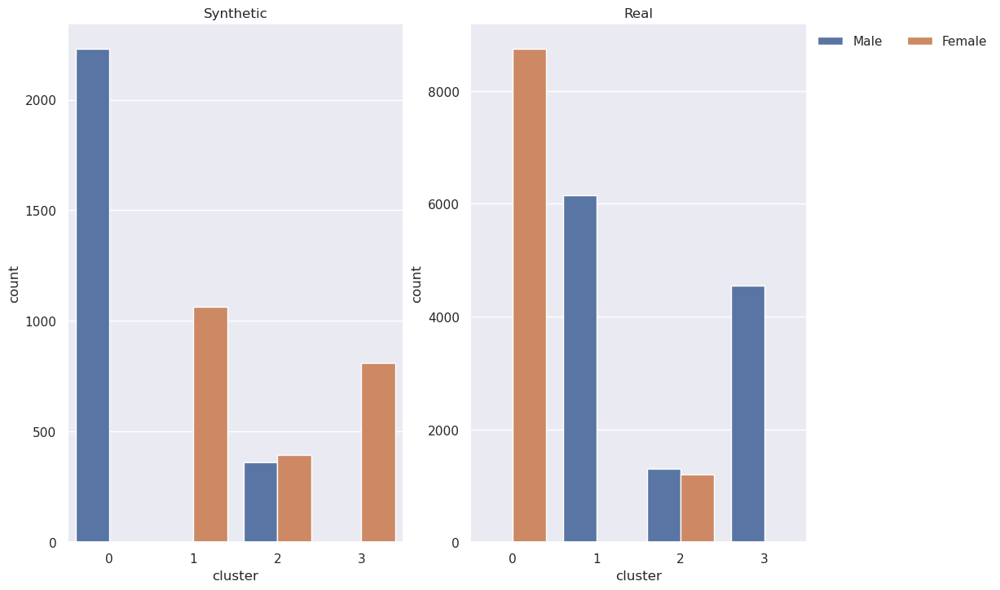

In [ ]:

#fig, (ax1, ax2) = plt.subplots(len(categorical_features), 2)
#fig, ax =plt.subplots(len(categorical_features),2)
for col in categorical_features:
    #fig, ax =plt.subplots(1,2)
    i = categorical_features.index(col)
    order = df_real[col].unique().tolist()

    fig, ax =plt.subplots(1,2)
    ax1 =sns.countplot(x='cluster', hue='{}'.format(col),data=df_real,ax=ax[0],hue_order =order)
    ax1.get_legend().set_visible(False)
    ax1.set_title('Real')
    ax2 =sns.countplot(x='cluster', hue='{}'.format(col), data=df_synth,ax=ax[1],hue_order = order)
    ax2.set_title('Synthetic')
    #ax1.set_xlabel('')
    #ax2.set_xlabel('')
    sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1), ncol=2, title=None, frameon=False)
plt.subplots_adjust(hspace = 0.1)
fig.show()

In [ ]:
import functions
import importlib
importlib.reload(functions)
from functions import cluster_profile_cat

In [ ]:
df_synth['cond1axis1Grp_1']=df_synth['cond1axis1GrpLast']
cluster_profile_cat(df_synth)

,sexDesc,ageGrpDesc,intensityGrp,cond1axis1Grp_1
cluster,,,,
0,Female,0-12,low,F90-F98
1,Male,0-12,low,F90-F98
2,Male,0-12,low,andre
3,Male,0-12,low,F40-F48


In [ ]:
df_real['cond1axis1Grp_1']=df_real['cond1axis1GrpLast']
cluster_profile_cat(df_real)

,sexDesc,ageGrpDesc,intensityGrp,cond1axis1Grp_1
cluster,,,,
0,Male,0-12,low,F90-F98
1,Female,13-19,low,F40-F48
2,Female,0-12,low,andre
3,Female,0-12,low,F90-F98


### Label classification

In [ ]:
lgbm_real_data.head()

,referralLength_cat,numOfStays_cat,cond1axis1GrpLast,ageGrpDesc,sexDesc
0,Long length,high intensity,F30-F39,13-19,Male
1,Long length,high intensity,F40-F48,13-19,Female
2,Long length,high intensity,andre,13-19,Male
3,Long length,low intensity,F30-F39,0-12,Female
4,Long length,high intensity,F40-F48,13-19,Female


In [ ]:
features =[
       'referralLength_cat', 
       'numOfStays_cat', 'cond1axis1GrpLast', 'ageGrpDesc','sexDesc'
       ]
categorical_features=features


lgbm_real_data= df_referrals_real_rec#[df_referrals_real_rec["outliers"]==0]
lgbm_synth_data=df_referrals_synth_rec#[df_referrals_synth_rec["outliers"]==0]

lgbm_synth_data[categorical_features] = lgbm_synth_data[categorical_features].astype('category')
lgbm_real_data[categorical_features] = lgbm_real_data[categorical_features].astype('category')
target_synth = clusters_s
target_real = clusters_r
lgbm_synth_data=lgbm_synth_data[features]  
lgbm_real_data=lgbm_real_data[features]  


#KMeans clusters
clf_kp = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
cv_scores_r = cross_val_score(clf_kp, lgbm_real_data, clusters_r, scoring='f1_weighted')




cv_scores_s = cross_val_score(clf_kp, lgbm_synth_data, clusters_s, scoring='f1_weighted')


print(f'CV F1 score for K-Means real clusters is {np.mean(cv_scores_r)}')
print(f'CV F1 score for K-Means synthetic clusters is {np.mean(cv_scores_s)}')






[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 3305, number of negative: 611
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000052 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18
[LightGBM] [Info] Number of data points in the train set: 3916, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.843973 -> initscore=1.688095
[LightGBM] [Info] Start training from score 1.688095
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 4132, number of negative: 763
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18
[LightGBM] [Info] Number of data points in the train set: 4895, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.844127 -> initscore=1.689259
[LightGBM] [Info] Start training from score 1.689259
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray

/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 427, number of negative: 3289
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18
[LightGBM] [Info] Number of data points in the train set: 3716, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.114909 -> initscore=-2.041555
[LightGBM] [Info] Start training from score -2.041555
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

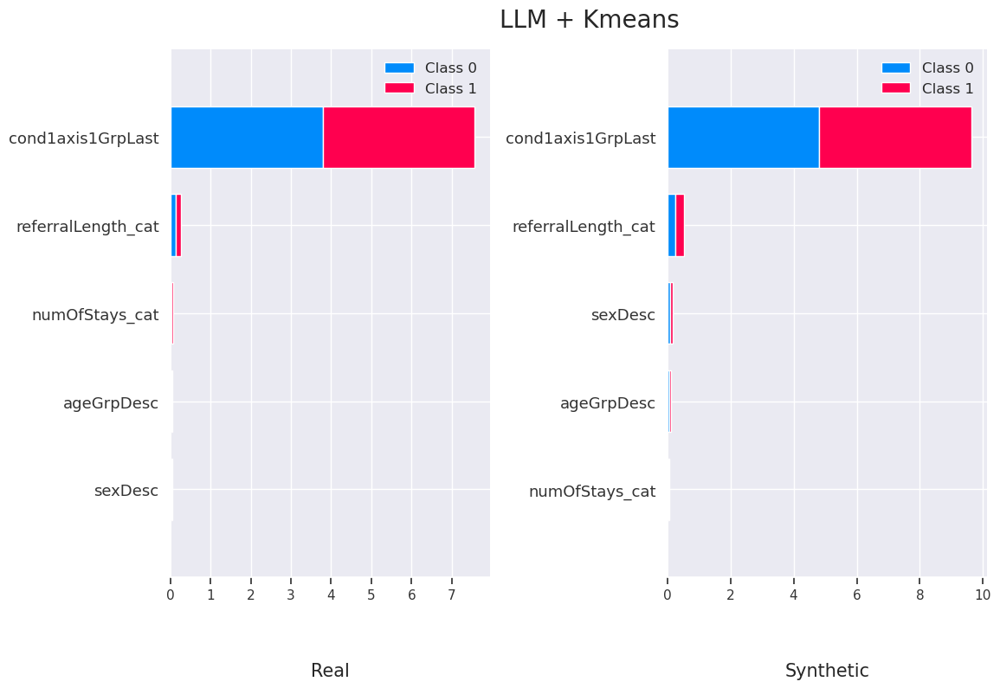

In [ ]:
clf_r = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_r.fit(lgbm_real_data,  target_real)
explainer_kp = shap.TreeExplainer(clf_r)
shap_values_s = explainer_kp.shap_values(lgbm_real_data)

clf_s = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_s.fit(lgbm_synth_data,  target_synth)
explainer_kp = shap.TreeExplainer(clf_s)
shap_values_r = explainer_kp.shap_values(lgbm_synth_data)



plt.subplot(1,2,1)
fig, ax = plt.gcf(), plt.gca()
fig.suptitle('LLM + Kmeans ', fontsize=20,horizontalalignment='left')
shap.summary_plot(shap_values_r ,lgbm_real_data, plot_size=None, plot_type="bar",show=False)
fig, ax = plt.gcf(), plt.gca()
ax.set_xlabel('')


plt.title("Real", y=-0.2,fontsize = 15)

plt.subplot(1,2,2)
shap.summary_plot(shap_values_s, lgbm_synth_data, plot_size=None, plot_type="bar",show=False)
fig, ax = plt.gcf(), plt.gca()
ax.set_xlabel('')
plt.title("Synthetic", y=-0.2,fontsize = 15)
#plt.legend('',frameon=False)
#plt.tight_layout()

plt.show()

## AgglomerativeClustering 

In [14]:
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import squareform


scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


For n_clusters = 2 The average silhouette_score for real data is : 0.3881633035496619 The average silhouette_score for synthetic data is : 0.3813229277037435


scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


For n_clusters = 3 The average silhouette_score for real data is : 0.378986177925541 The average silhouette_score for synthetic data is : 0.2931780835684101


scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


For n_clusters = 4 The average silhouette_score for real data is : 0.3735498132640942 The average silhouette_score for synthetic data is : 0.3363055825323927


scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


For n_clusters = 5 The average silhouette_score for real data is : 0.4801628917836404 The average silhouette_score for synthetic data is : 0.42123555046667616


scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


For n_clusters = 6 The average silhouette_score for real data is : 0.5043652051432241 The average silhouette_score for synthetic data is : 0.45975891211990955


scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


For n_clusters = 7 The average silhouette_score for real data is : 0.4918803953137132 The average silhouette_score for synthetic data is : 0.48692284399364205


scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


For n_clusters = 8 The average silhouette_score for real data is : 0.5292239058239813 The average silhouette_score for synthetic data is : 0.4438997067986444


scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


For n_clusters = 9 The average silhouette_score for real data is : 0.5665375354914923 The average silhouette_score for synthetic data is : 0.47473068120508827


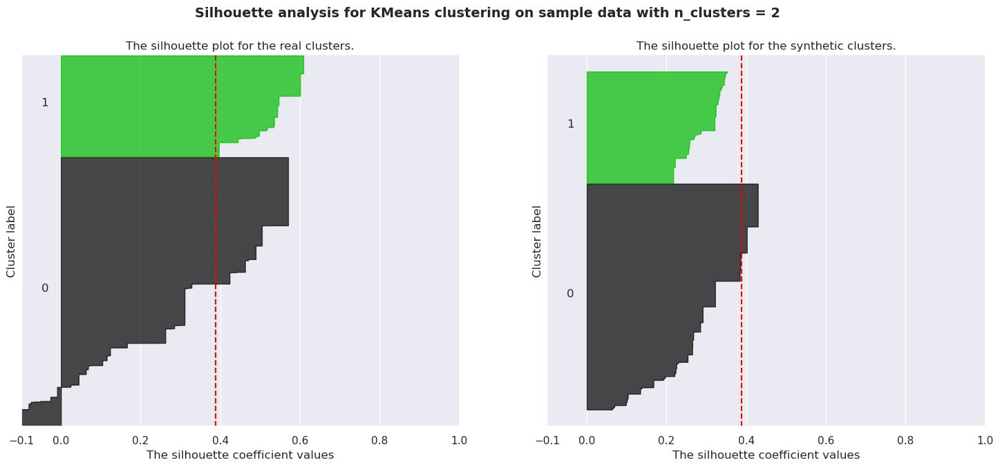

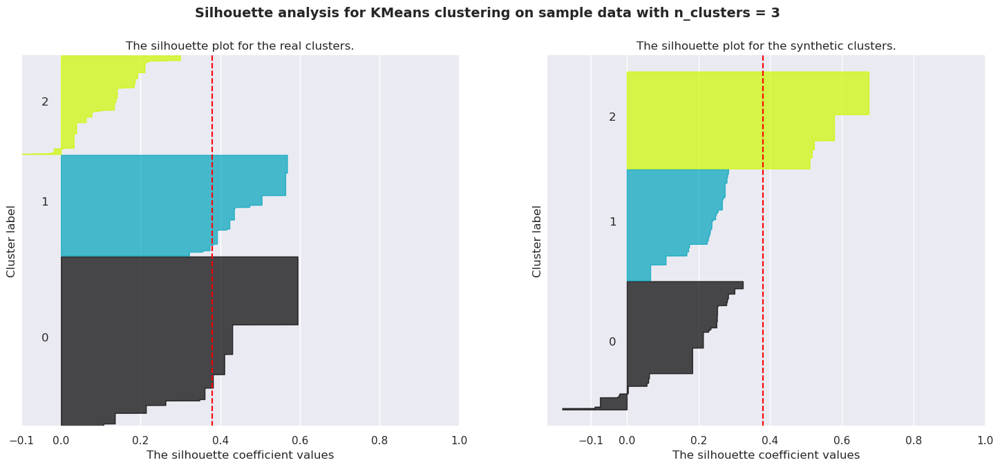

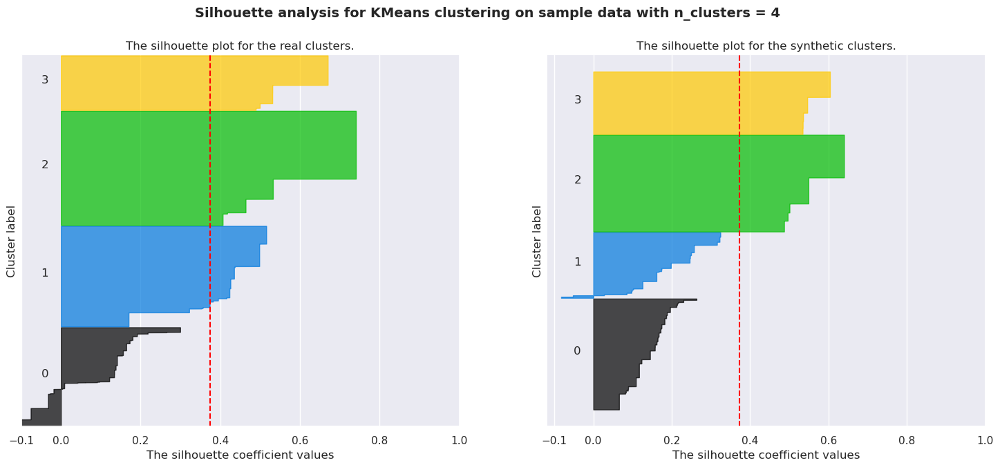

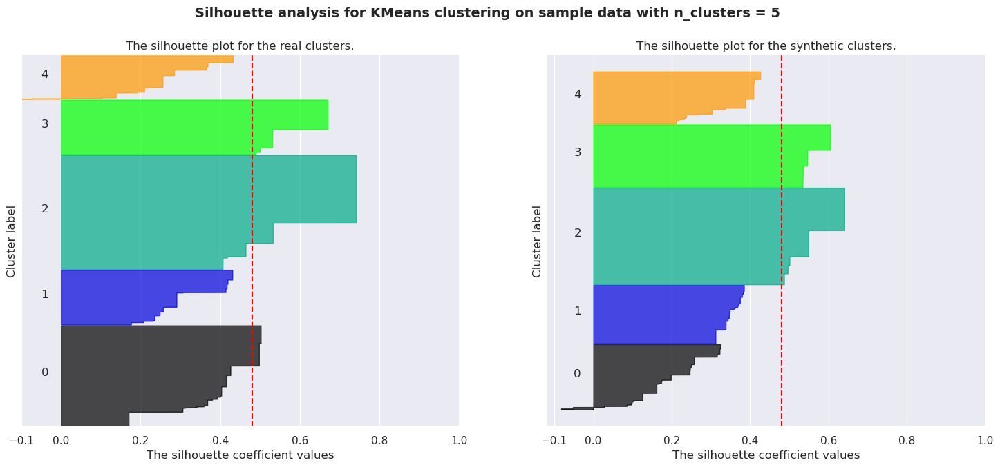

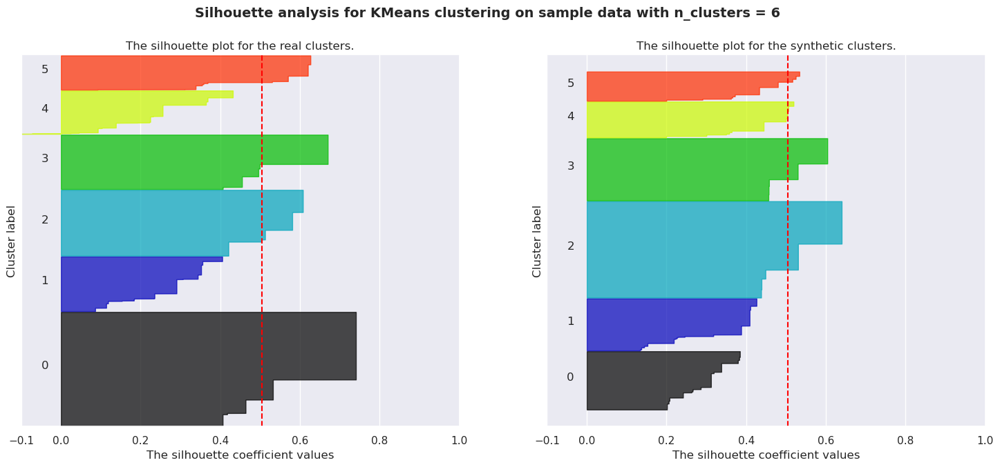

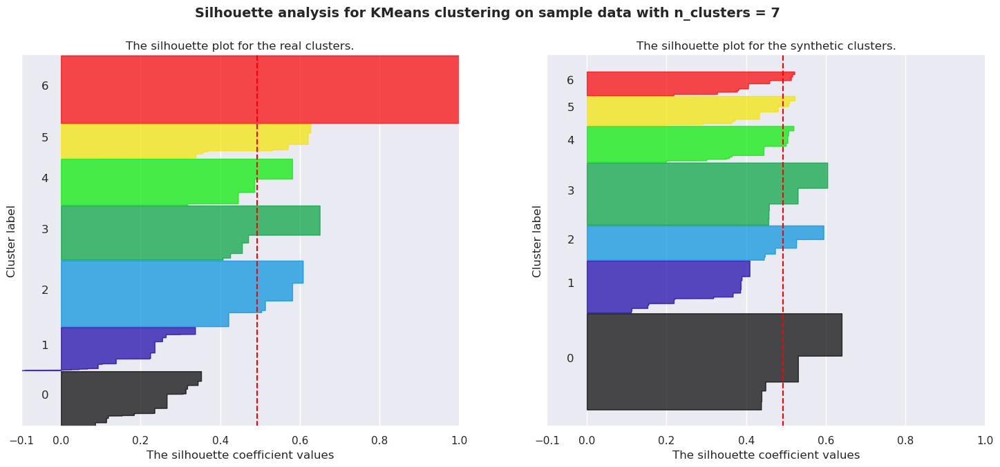

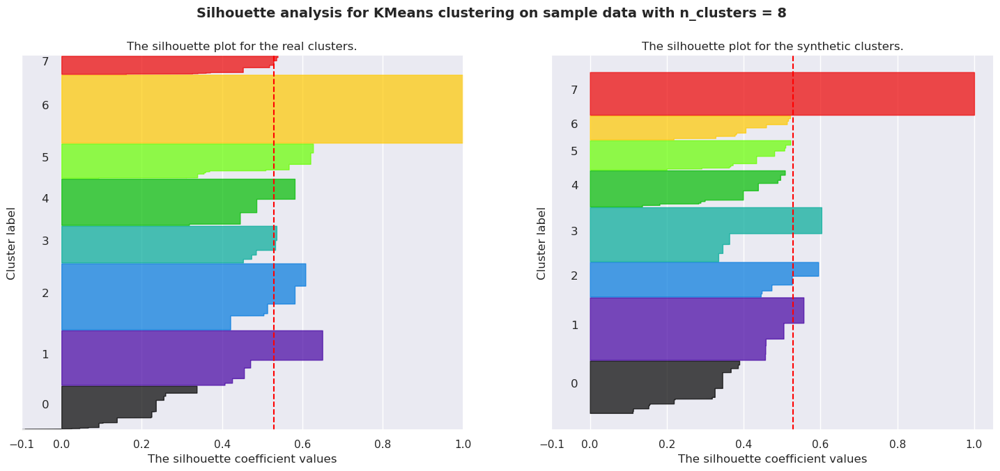

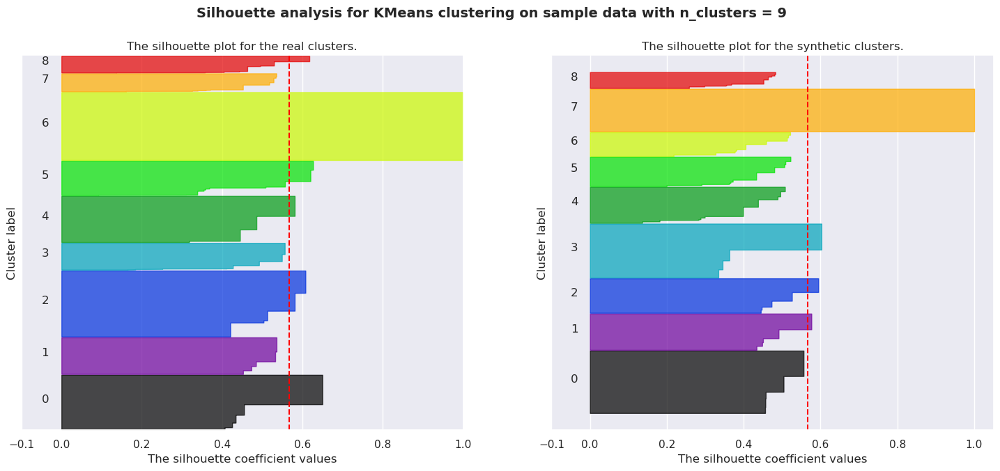

In [15]:
range_n_clusters = range(2,10)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_referrals_real_rec) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    
    aggcl = AgglomerativeClustering(n_clusters=n_clusters
                ,linkage='ward'
                     )

    cluster_labels_s = aggcl.fit_predict(h_distance_matrix_s)
    cluster_labels_r = aggcl.fit_predict(h_distance_matrix_r)
    
    silhouette_avg_r=silhouette_score(h_distance_matrix_r, cluster_labels_r,metric="precomputed")
    silhouette_avg_s=silhouette_score(h_distance_matrix_s, cluster_labels_s,metric="precomputed")
    

    

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score for real data is :",
        silhouette_avg_r,
         "The average silhouette_score for synthetic data is :",
        silhouette_avg_s,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values_r = silhouette_samples(h_distance_matrix_r, cluster_labels_r)
    sample_silhouette_values_s = silhouette_samples(h_distance_matrix_s, cluster_labels_s)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values_r[cluster_labels_r == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the real clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg_r, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    ### draw synthetic
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values_s[cluster_labels_s == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax2.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax2.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax2.set_title("The silhouette plot for the synthetic clusters.")
    ax2.set_xlabel("The silhouette coefficient values")
    ax2.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax2.axvline(x=silhouette_avg_r, color="red", linestyle="--")

    ax2.set_yticks([])  # Clear the yaxis labels / ticks
    ax2.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [16]:
aggcl = AgglomerativeClustering(n_clusters=2
                ,linkage='ward'
                     )

clusters_s = aggcl.fit_predict(h_distance_matrix_s)
clusters_r = aggcl.fit_predict(h_distance_matrix_r)

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


In [19]:
df_real= df_referrals_real_orig.copy()
df_synth= df_referrals_synth_orig.copy()
df_synth['cluster']=clusters_s
df_real['cluster']=clusters_r

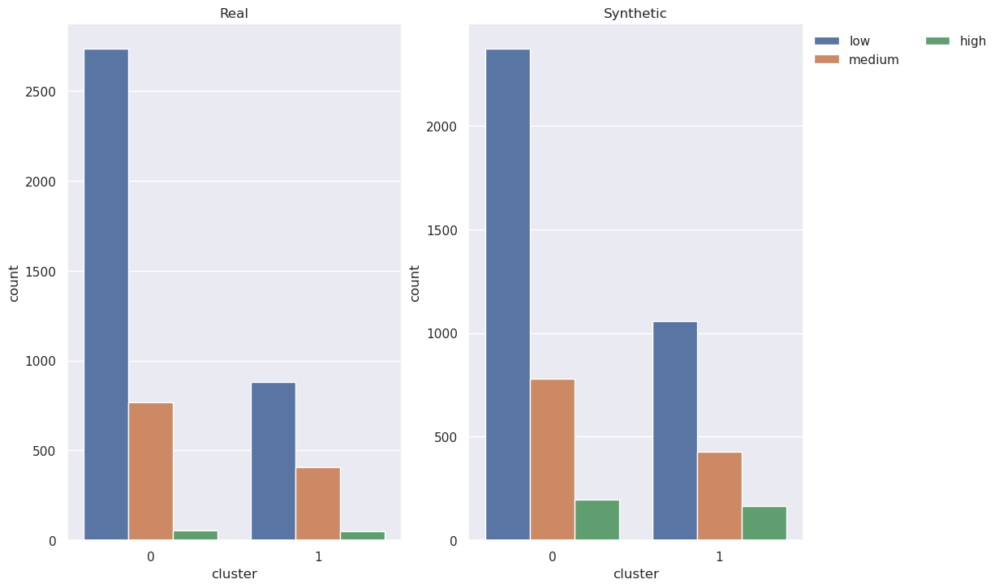

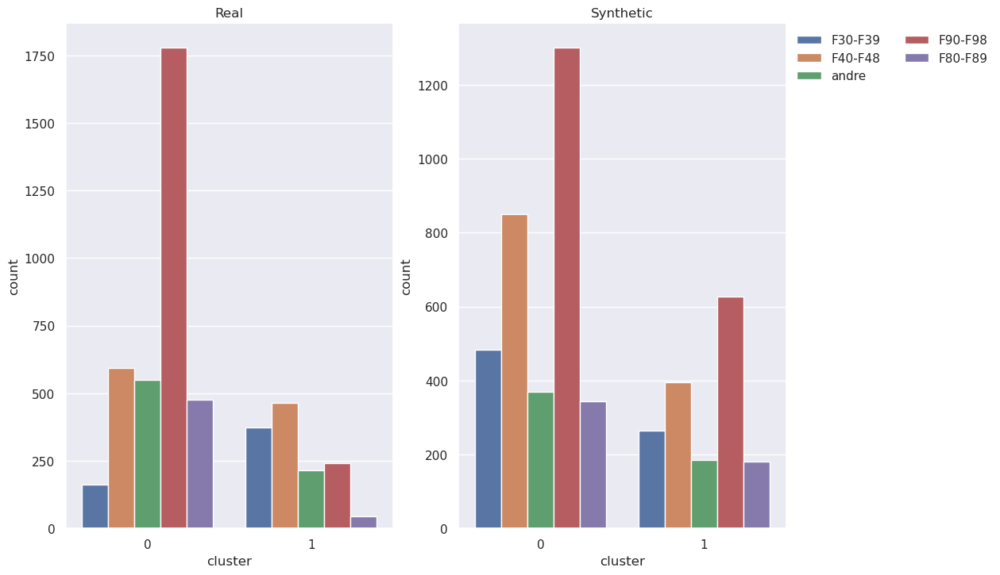

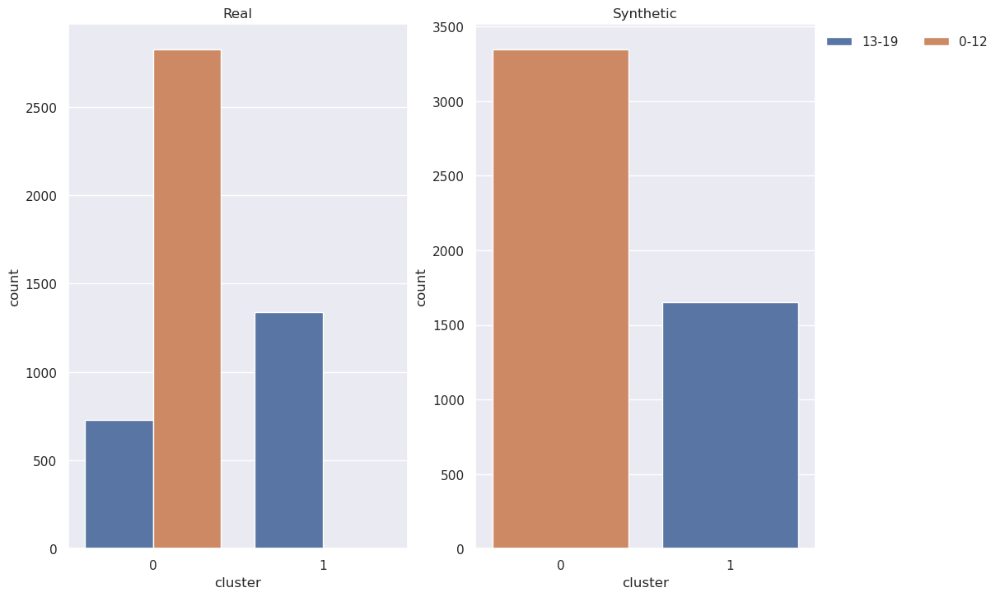

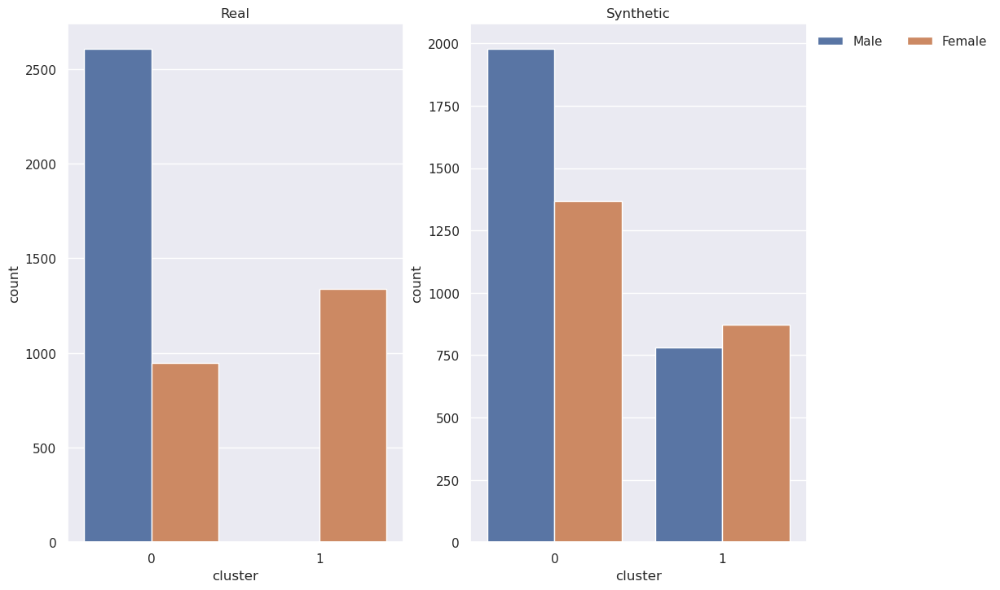

In [27]:

#fig, (ax1, ax2) = plt.subplots(len(categorical_features), 2)
#fig, ax =plt.subplots(len(categorical_features),2)
for col in categorical_features:
    #fig, ax =plt.subplots(1,2)
    i = categorical_features.index(col)
    order = df_real[col].unique().tolist()

    fig, ax =plt.subplots(1,2)
    ax1 =sns.countplot(x='cluster', hue='{}'.format(col),data=df_real,ax=ax[0],hue_order =order)
    ax1.get_legend().set_visible(False)
    ax1.set_title('Real')
    ax2 =sns.countplot(x='cluster', hue='{}'.format(col), data=df_synth,ax=ax[1],hue_order = order)
    ax2.set_title('Synthetic')
    #ax1.set_xlabel('')
    #ax2.set_xlabel('')
    sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1), ncol=2, title=None, frameon=False)
plt.subplots_adjust(hspace = 0.1)
fig.show()

In [23]:
import functions
import importlib
importlib.reload(functions)
from functions import cluster_profile_cat
df_synth['cond1axis1Grp_1']=df_synth['cond1axis1GrpLast']
df_synth['cond1axis1Grp_2']=df_synth['cond1axis1GrpLast']
cluster_profile_cat(df_synth)


,sexDesc,ageGrpDesc,intensityGrp,intensity,cond1axis1Grp_1
cluster,,,,,
0,Male,0-12,low,8.255372,F90-F98
1,Female,13-19,low,10.000000,F90-F98


In [22]:

df_real['cond1axis1Grp_1']=df_real['cond1axis1GrpLast']
cluster_profile_cat(df_real)

,sexDesc,ageGrpDesc,intensityGrp,intensity,cond1axis1Grp_1
cluster,,,,,
0,Male,0-12,low,5.404738,F90-F98
1,Female,13-19,low,8.849030,F40-F48


# Mixed DataType Clustering

In [8]:
import pickle as pkl

In [9]:
df_referrals_synth_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21950 entries, 0 to 21949
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          21950 non-null  int64         
 1   referralStartDate   21950 non-null  datetime64[ns]
 2   referralLength      21950 non-null  int64         
 3   age                 21950 non-null  int64         
 4   sex                 21950 non-null  int64         
 5   ageGrpDesc          21950 non-null  object        
 6   ageGrp              21950 non-null  int64         
 7   sexDesc             21950 non-null  object        
 8   stayLength          21950 non-null  float64       
 9   cond1axis1GrpFirst  21950 non-null  object        
 10  cond1axis1GrpLast   21950 non-null  object        
 11  numOfStays          21950 non-null  int64         
 12  factor              21950 non-null  float64       
 13  intensity           21950 non-null  float64   

In [10]:
features=['intensity', 'age', 'sexDesc',
    
       'cond1axis1GrpLast']
categorical_features =[ 'sexDesc',
    
       'cond1axis1GrpLast']
numerical_features =[ 'age','intensity']

In [11]:
df_referrals_synth_scaled = df_referrals_synth_orig.copy()
df_referrals_real_scaled = df_referrals_real_orig.copy()

df_referrals_synth_scaled= df_referrals_synth_scaled[features]
df_referrals_real_scaled= df_referrals_real_scaled[features]
df_referrals_synth_scaled[categorical_features]= df_referrals_synth_scaled[categorical_features].astype(object)
df_referrals_real_scaled[categorical_features]= df_referrals_real_scaled[categorical_features].astype(object)

In [12]:
df_referrals_real_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4895 entries, 0 to 4894
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   intensity          4895 non-null   float64
 1   age                4895 non-null   int64  
 2   sexDesc            4895 non-null   object 
 3   cond1axis1GrpLast  4895 non-null   object 
dtypes: float64(1), int64(1), object(2)
memory usage: 153.1+ KB


In [13]:
df_referrals_synth_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21950 entries, 0 to 21949
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   intensity          21950 non-null  float64
 1   age                21950 non-null  int64  
 2   sexDesc            21950 non-null  object 
 3   cond1axis1GrpLast  21950 non-null  object 
dtypes: float64(1), int64(1), object(2)
memory usage: 686.1+ KB


In [14]:
catColumnsPos = [df_referrals_synth_scaled.columns.get_loc(col) for col in categorical_features]
print('Categorical columns           : {}'.format(categorical_features))
print('Categorical columns position  : {}'.format(catColumnsPos))

Categorical columns           : ['sexDesc', 'cond1axis1GrpLast']
Categorical columns position  : [2, 3]


In [15]:

for c in numerical_features:
    pt = PowerTransformer()
    df_referrals_synth_scaled[c] =  pt.fit_transform(np.array(df_referrals_synth_orig[c]).reshape(-1, 1))
    df_referrals_real_scaled[c] =  pt.fit_transform(np.array(df_referrals_real_orig[c]).reshape(-1, 1))

In [16]:
df_referrals_synth_scaled[categorical_features] = df_referrals_synth_scaled[categorical_features].astype(object)
df_referrals_synth_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21950 entries, 0 to 21949
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   intensity          21950 non-null  float64
 1   age                21950 non-null  float64
 2   sexDesc            21950 non-null  object 
 3   cond1axis1GrpLast  21950 non-null  object 
dtypes: float64(2), object(2)
memory usage: 686.1+ KB


In [17]:
import functions
import importlib
importlib.reload(functions)
from functions import dm_prototypes

In [67]:
distance_matrix_r = dm_prototypes(df_referrals_real_scaled,categorical=catColumnsPos,alpha=0.1)

distance_matrix_s = dm_prototypes(df_referrals_synth_scaled,categorical=catColumnsPos,alpha=0.1)

In [18]:
distance_matrix_r = dm_prototypes(df_referrals_real_scaled,categorical=catColumnsPos,alpha=0.1)
import pickle as pkl
with open('mixed_distance_matrix_r.pkl','wb') as f:
         pkl.dump(distance_matrix_r, f)


KeyboardInterrupt: 

In [46]:

distance_matrix_s = dm_prototypes(df_referrals_synth_scaled,categorical=catColumnsPos,alpha=0.1)

with open('mixed_distance_matrix_s.pkl','wb') as f:
         pkl.dump(distance_matrix_s, f)

In [ ]:
#distance_matrix_s =  distance_matrix_s.astype(np.float64) 
#distance_matrix_r =  distance_matrix_r.astype(np.float64) 

In [19]:

with open('../../../data/processed/mixed_distance_matrix_r.pkl','rb') as f:
        distance_matrix_r = pkl.load(f)

In [20]:
with open('../../../data/processed/mixed_distance_matrix_s.pkl','rb') as f:
        distance_matrix_s = pkl.load(f)

## Kprototype + hamming/euclidian

In [28]:
from kmodes.kprototypes import KPrototypes

In [68]:
range_n_clusters = range(2,10)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(distance_matrix_r) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
  
    kproto = KPrototypes(n_clusters=n_clusters, init='Huang', 
                     n_jobs = 2, verbose=0, 
                     random_state=random_state)

    cluster_labels_s = kproto.fit_predict(df_referrals_synth_scaled, categorical=catColumnsPos)
    cluster_labels_r = kproto.fit_predict(df_referrals_real_scaled, categorical=catColumnsPos)

    
    silhouette_avg_r=silhouette_score(distance_matrix_r, cluster_labels_r,metric="precomputed")
    silhouette_avg_s=silhouette_score(distance_matrix_s, cluster_labels_s,metric="precomputed")
    

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score for real data is :",
        silhouette_avg_r,
         "The average silhouette_score for synthetic data is :",
        silhouette_avg_s,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values_r = silhouette_samples(distance_matrix_r, cluster_labels_r)
    sample_silhouette_values_s = silhouette_samples(distance_matrix_s, cluster_labels_s)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values_r[cluster_labels_r == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the real clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg_r, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    ### draw synthetic
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values_s[cluster_labels_s == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax2.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax2.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax2.set_title("The silhouette plot for the synthetic clusters.")
    ax2.set_xlabel("The silhouette coefficient values")
    ax2.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax2.axvline(x=silhouette_avg_r, color="red", linestyle="--")

    ax2.set_yticks([])  # Clear the yaxis labels / ticks
    ax2.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle(
        "Silhouette analysis for Kprototype clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

For n_clusters = 2 The average silhouette_score for real data is : 0.27292737217257956 The average silhouette_score for synthetic data is : 0.17361957631975927
For n_clusters = 3 The average silhouette_score for real data is : 0.16918837604786957 The average silhouette_score for synthetic data is : 0.12801879173127234


In [67]:
kproto = KPrototypes(n_clusters=2, init='Huang', 
                     n_jobs = 4, verbose=0, 
                     random_state=random_state)

clusters_s = kproto.fit_predict(df_referrals_synth_scaled, categorical=catColumnsPos)
clusters_r = kproto.fit_predict(df_referrals_real_scaled, categorical=catColumnsPos)

### Evaluate

In [69]:
mca_3d_s, mca_3d_df_s = get_MCA_3d(df_referrals_synth_scaled, clusters_s)
mca_3d_r, mca_3d_df_r = get_MCA_3d(df_referrals_real_scaled, clusters_r)

In [70]:
mca_3d_s.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.515,0.06%,0.06%
1,0.485,0.05%,0.11%
2,0.480,0.05%,0.16%


In [71]:
mca_3d_r.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.650,0.07%,0.07%
1,0.526,0.06%,0.13%
2,0.489,0.05%,0.18%


In [72]:
plot_pca_2d(mca_3d_df_s, title="MCA Space Synthetic", opacity=1, width_line = 0.1)

In [73]:
plot_pca_2d(mca_3d_df_r, title="MCA Space Real", opacity=1, width_line = 0.1)

### EDA

In [74]:
#temp = clusters_s

In [75]:
#clusters_s[clusters_s == 0] = 2
#clusters_s[clusters_s == 1] = 0
#clusters_s[clusters_s == 2] = 1

In [76]:
df_real= df_referrals_real_orig.copy()
df_synth= df_referrals_synth_orig.copy()
df_synth['cluster']=clusters_s
df_real['cluster']=clusters_r

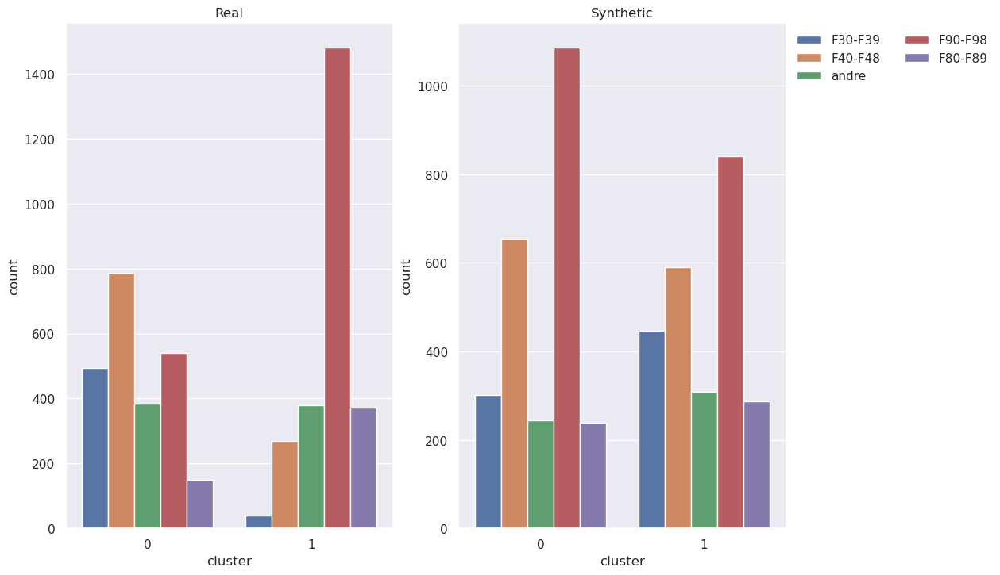

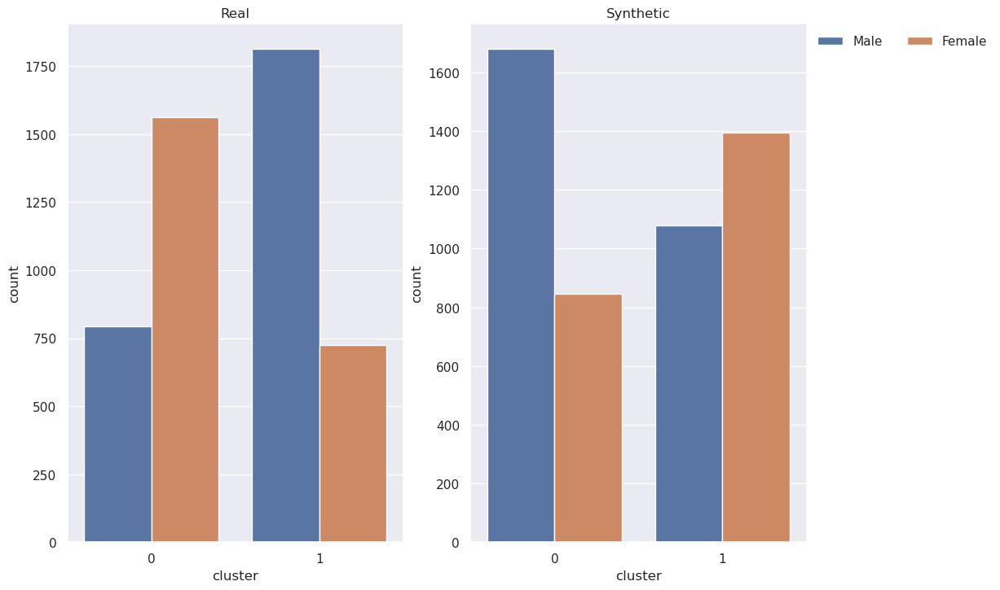

In [77]:

#fig, (ax1, ax2) = plt.subplots(len(categorical_features), 2)
#fig, ax =plt.subplots(2,2)
for col in categorical_features:
    i = categorical_features.index(col)
    order = df_real[col].unique().tolist()

    fig, ax =plt.subplots(1,2)
    ax1 =sns.countplot(x='cluster', hue='{}'.format(col),data=df_real,ax=ax[0],hue_order =order)
    ax1.get_legend().set_visible(False)
    ax1.set_title('Real')
    ax2 =sns.countplot(x='cluster', hue='{}'.format(col), data=df_synth,ax=ax[1],hue_order = order)
    ax2.set_title('Synthetic')
    #ax1.set_xlabel('')
    #ax2.set_xlabel('')
    sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1), ncol=2, title=None, frameon=False)
plt.subplots_adjust(hspace = 0.8)
fig.show()

In [78]:
numerical_features

['age', 'intensity']

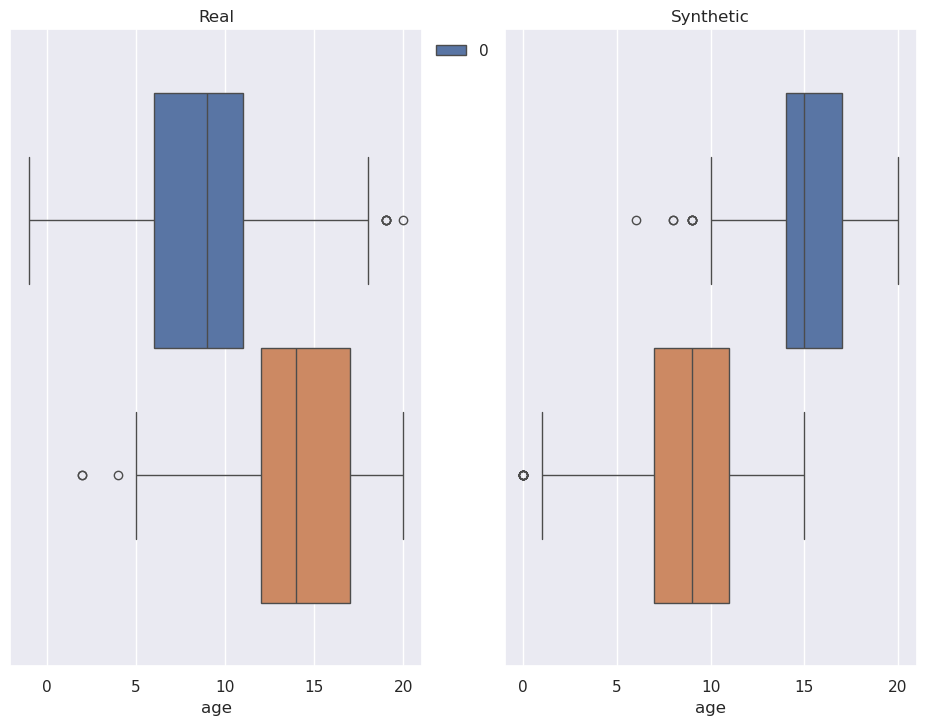

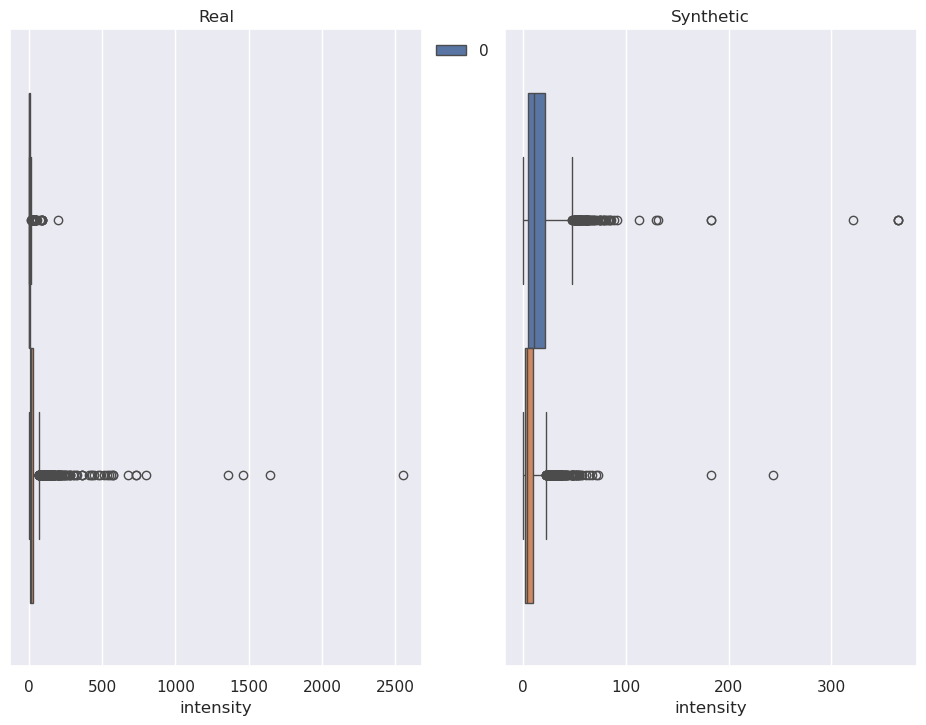

In [79]:

#fig, (ax1, ax2) = plt.subplots(len(categorical_features), 2)
#fig, ax =plt.subplots(len(numerical_features),2)
for col in numerical_features:
    i = numerical_features.index(col)
    order = df_real[col].unique().tolist()

    fig, ax =plt.subplots(1,2)
    ax1 =sns.boxplot(x=col, hue='{}'.format('cluster'),data=df_real,ax=ax[1])
    ax1.get_legend().set_visible(False)
    ax1.set_title('Synthetic' )
    ax2 =sns.boxplot(x=col, hue='{}'.format('cluster'), data=df_synth,ax=ax[0])
    ax2.set_title('Real')
    #ax1.set_xlabel('')
    #ax2.set_xlabel('')
    sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1), ncol=2, title=None, frameon=False)
plt.subplots_adjust(hspace = 0.1)
fig.show()   

In [80]:
import functions
import importlib
importlib.reload(functions)
from functions import cluster_profile
df_synth['cond1axis1Grp_1']=df_synth['cond1axis1GrpLast']
df_synth['cond1axis1Grp_2']=df_synth['cond1axis1GrpLast']
cluster_profile(df_synth)


,sexDesc,age,intensity,cond1axis1Grp_1,cond1axis1Grp_2
cluster,,,,,
0,Male,8.577364,5.041436,F90-F98,F40-F48
1,Female,14.147998,16.102941,F90-F98,F40-F48


In [81]:
df_real['cond1axis1Grp_1']=df_real['cond1axis1GrpLast']
df_real['cond1axis1Grp_2']=df_real['cond1axis1GrpLast']

cluster_profile(df_real)

,sexDesc,age,intensity,cond1axis1Grp_1,cond1axis1Grp_2
cluster,,,,,
0,Female,15.145586,10.712900,F40-F48,F90-F98
1,Male,8.665616,3.523166,F90-F98,andre


### Label classification

In [82]:
df_referrals_real_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4895 entries, 0 to 4894
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   intensity          4895 non-null   float64
 1   age                4895 non-null   float64
 2   sexDesc            4895 non-null   object 
 3   cond1axis1GrpLast  4895 non-null   object 
dtypes: float64(2), object(2)
memory usage: 153.1+ KB


In [83]:
df_referrals_synth_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5000 entries, 18488 to 9810
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   intensity          5000 non-null   float64
 1   age                5000 non-null   float64
 2   sexDesc            5000 non-null   object 
 3   cond1axis1GrpLast  5000 non-null   object 
dtypes: float64(2), object(2)
memory usage: 195.3+ KB


In [86]:
features =[
       'intensity', 
        'cond1axis1GrpLast', 'age','sexDesc'
       ]
categorical_features=[  'cond1axis1GrpLast', 'sexDesc']


lgbm_real_data= df_referrals_real_scaled.copy()
lgbm_synth_data= df_referrals_synth_scaled.copy()

lgbm_synth_data[categorical_features] = lgbm_synth_data[categorical_features].astype('category')
lgbm_real_data[categorical_features] = lgbm_real_data[categorical_features].astype('category')
target_synth = clusters_s
target_real = clusters_r
lgbm_synth_data=lgbm_synth_data[features]  
lgbm_real_data=lgbm_real_data[features]  


#KMeans clusters
clf_kp = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
cv_scores_r = cross_val_score(clf_kp, lgbm_real_data, clusters_r, scoring='f1_weighted')




cv_scores_s = cross_val_score(clf_kp, lgbm_synth_data, clusters_s, scoring='f1_weighted')


print(f'CV F1 score for K-Means real clusters is {np.mean(cv_scores_r)}')
print(f'CV F1 score for K-Means synthetic clusters is {np.mean(cv_scores_s)}')






[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 2032, number of negative: 1884
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 3916, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.518897 -> initscore=0.075623
[LightGBM] [Info] Start training from score 0.075623
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fr

[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 2539, number of negative: 2356
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 4895, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.518693 -> initscore=0.074805
[LightGBM] [Info] Start training from score 0.074805
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 2401, number of negative: 2599
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 5000, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.480200 -> initscore=-0.079241
[LightGBM] [Info] Start training from score -0.079241


/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



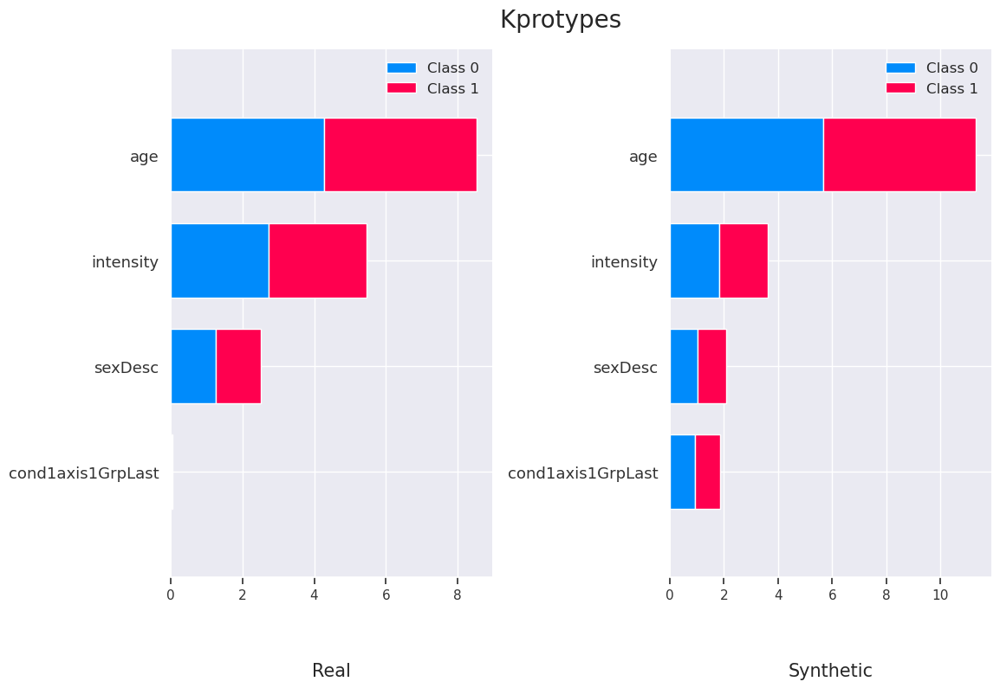

In [87]:
clf_r = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_r.fit(lgbm_real_data,  target_real)
explainer_kp = shap.TreeExplainer(clf_r)
shap_values_s = explainer_kp.shap_values(lgbm_real_data)

clf_s = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_s.fit(lgbm_synth_data,  target_synth)
explainer_kp = shap.TreeExplainer(clf_s)
shap_values_r = explainer_kp.shap_values(lgbm_synth_data)



plt.subplot(1,2,1)
fig, ax = plt.gcf(), plt.gca()
fig.suptitle('Kprotypes ', fontsize=20,horizontalalignment='left')
shap.summary_plot(shap_values_r ,lgbm_real_data, plot_size=None, plot_type="bar",show=False)
fig, ax = plt.gcf(), plt.gca()
ax.set_xlabel('')


plt.title("Real", y=-0.2,fontsize = 15)

plt.subplot(1,2,2)
shap.summary_plot(shap_values_s, lgbm_synth_data, plot_size=None, plot_type="bar",show=False)
fig, ax = plt.gcf(), plt.gca()
ax.set_xlabel('')
plt.title("Synthetic", y=-0.2,fontsize = 15)
#plt.legend('',frameon=False)
#plt.tight_layout()

plt.show()

## Kmedoids + hamming/euclidean

In [21]:
from sklearn_extra.cluster import KMedoids

For n_clusters = 2 The average silhouette_score for real data is : 0.3977966384811172 The average silhouette_score for synthetic data is : 0.4750614592174588
For n_clusters = 3 The average silhouette_score for real data is : 0.38501019770404876 The average silhouette_score for synthetic data is : 0.3430872901319267
For n_clusters = 4 The average silhouette_score for real data is : 0.35892636961689417 The average silhouette_score for synthetic data is : 0.33157627048814925
For n_clusters = 5 The average silhouette_score for real data is : 0.43443412671260645 The average silhouette_score for synthetic data is : 0.39108938551900685
For n_clusters = 6 The average silhouette_score for real data is : 0.5229671099271201 The average silhouette_score for synthetic data is : 0.4536399886434689
For n_clusters = 7 The average silhouette_score for real data is : 0.5944488510285548 The average silhouette_score for synthetic data is : 0.5196645931914683
For n_clusters = 8 The average silhouette_score

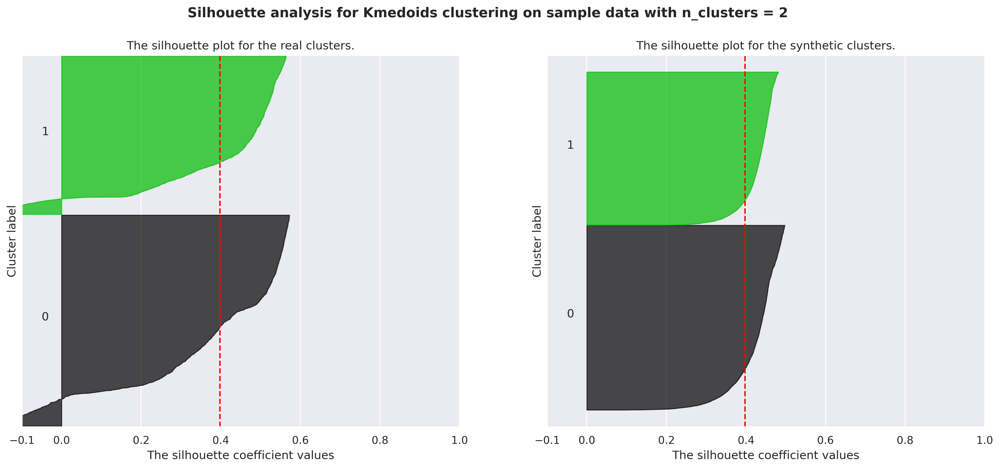

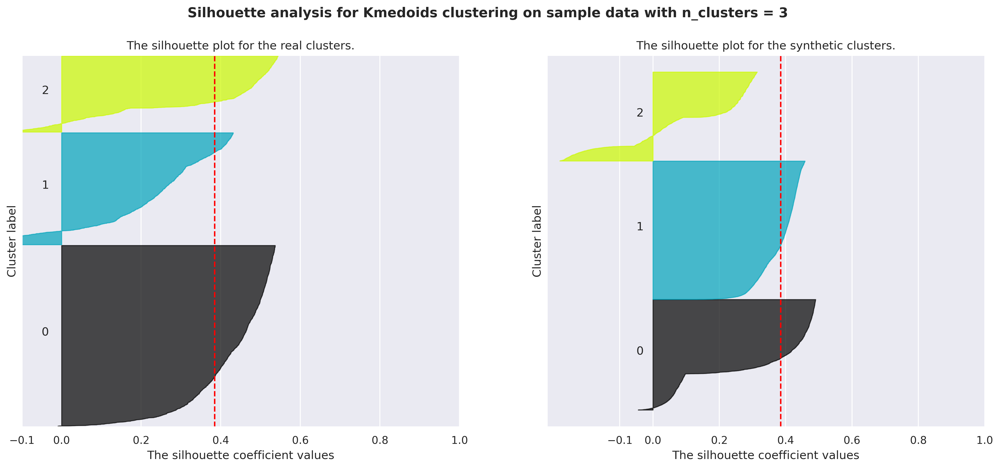

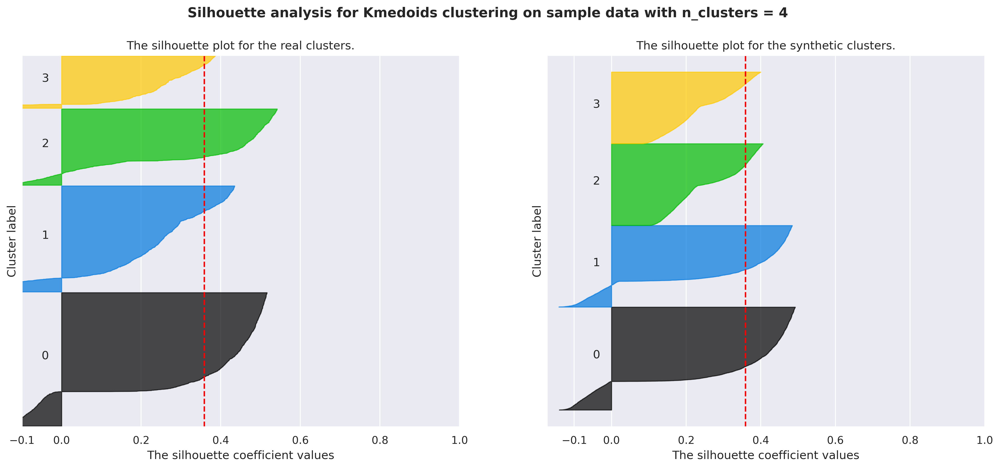

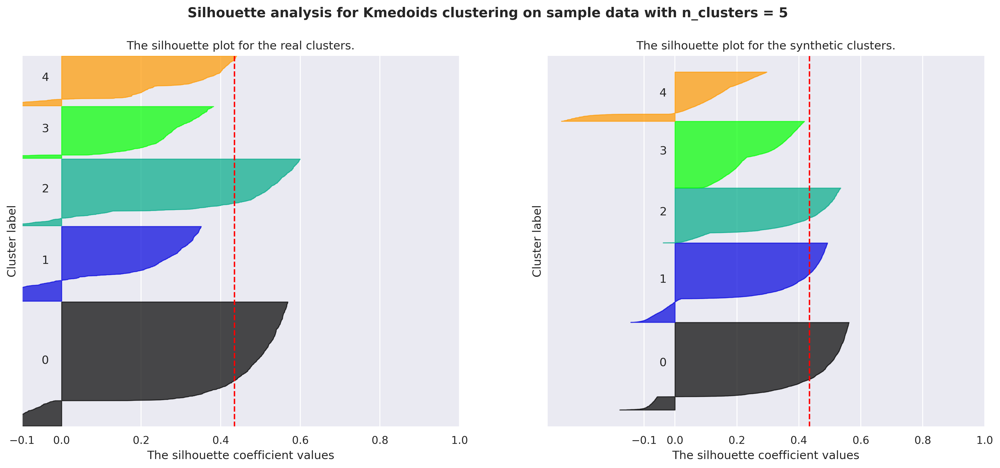

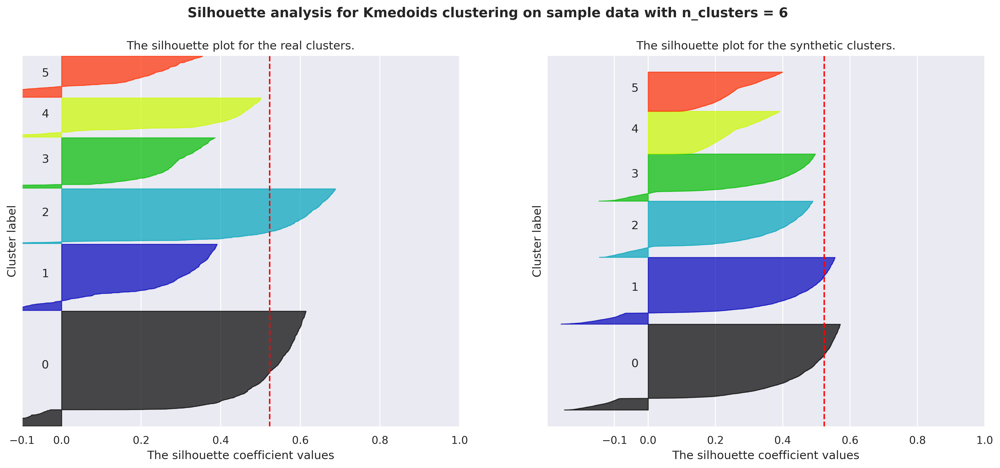

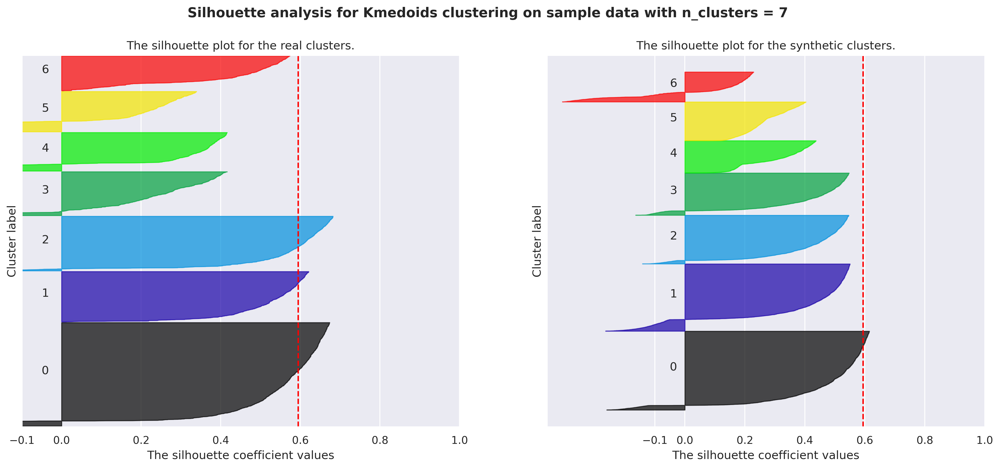

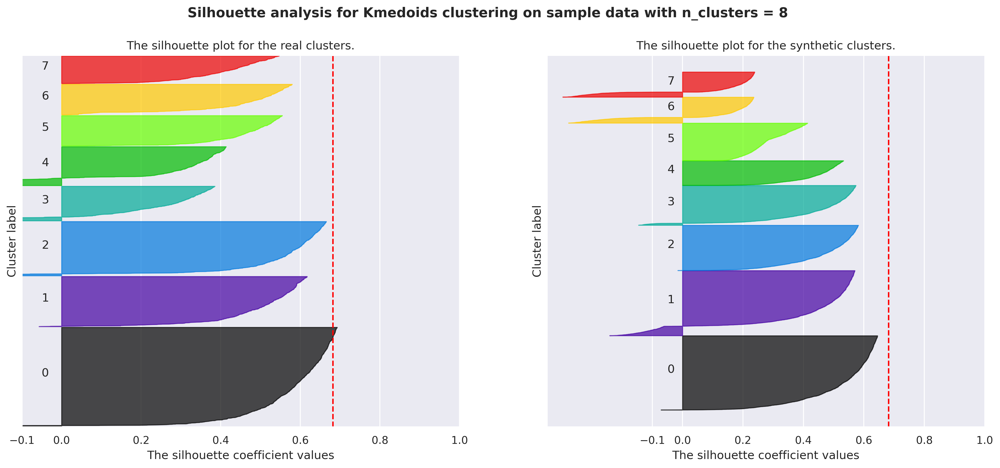

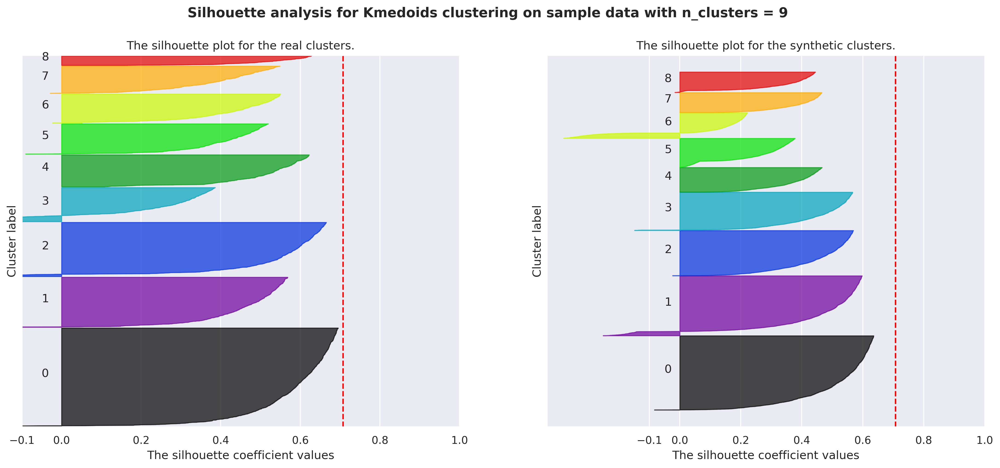

In [22]:


range_n_clusters = range(2,10)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(distance_matrix_r) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    
    kmpoids = KMedoids(n_clusters=n_clusters, 
                           metric='precomputed',
                           method='pam', init='build', 
                           max_iter=300, 
                           random_state=random_state) 

    cluster_labels_s = kmpoids.fit(distance_matrix_s).labels_
    cluster_labels_r = kmpoids.fit(distance_matrix_r).labels_

    
    silhouette_avg_r=silhouette_score(distance_matrix_r, cluster_labels_r,metric="precomputed")
    silhouette_avg_s=silhouette_score(distance_matrix_s, cluster_labels_s,metric="precomputed")
    

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score for real data is :",
        silhouette_avg_r,
         "The average silhouette_score for synthetic data is :",
        silhouette_avg_s,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values_r = silhouette_samples(distance_matrix_r, cluster_labels_r)
    sample_silhouette_values_s = silhouette_samples(distance_matrix_s, cluster_labels_s)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values_r[cluster_labels_r == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the real clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg_r, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    ### draw synthetic
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values_s[cluster_labels_s == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax2.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax2.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax2.set_title("The silhouette plot for the synthetic clusters.")
    ax2.set_xlabel("The silhouette coefficient values")
    ax2.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax2.axvline(x=silhouette_avg_r, color="red", linestyle="--")

    ax2.set_yticks([])  # Clear the yaxis labels / ticks
    ax2.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle(
        "Silhouette analysis for Kmedoids clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [23]:

kmpoids = KMedoids(n_clusters=2,  metric='precomputed',
                           method='pam', init='build', 
                           max_iter=300, 
                           random_state=random_state) 

clusters_s = kmpoids.fit(distance_matrix_s).labels_
clusters_r = kmpoids.fit(distance_matrix_r).labels_


    
#clusters = kmedoids.labels_#kproto.fit_predict(dfMatrix, categorical = catColumnsPos)

In [85]:
mca_3d_s, mca_3d_df_s = get_MCA_3d(df_referrals_synth_scaled, clusters_s)
mca_3d_r, mca_3d_df_r = get_MCA_3d(df_referrals_real_scaled, clusters_r)

In [86]:
mca_3d_s.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.515,0.06%,0.06%
1,0.485,0.05%,0.11%
2,0.480,0.05%,0.16%


In [87]:
mca_3d_r.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.650,0.07%,0.07%
1,0.526,0.06%,0.13%
2,0.489,0.05%,0.18%


In [88]:
plot_pca_2d(mca_3d_df_s, title="MCA Space synthetic", opacity=1, width_line = 0.1)

In [89]:
plot_pca_2d(mca_3d_df_r, title="MCA Space real", opacity=1, width_line = 0.1)

### EDA

In [24]:
df_real= df_referrals_real_orig.copy()
df_synth= df_referrals_synth_orig.copy()
df_synth['cluster']=clusters_s
df_real['cluster']=clusters_r

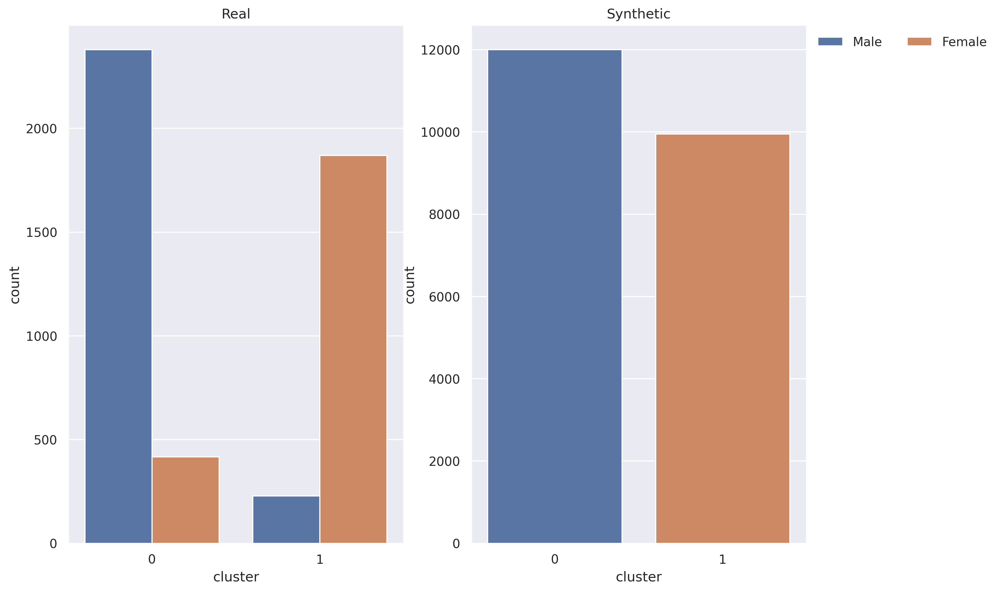

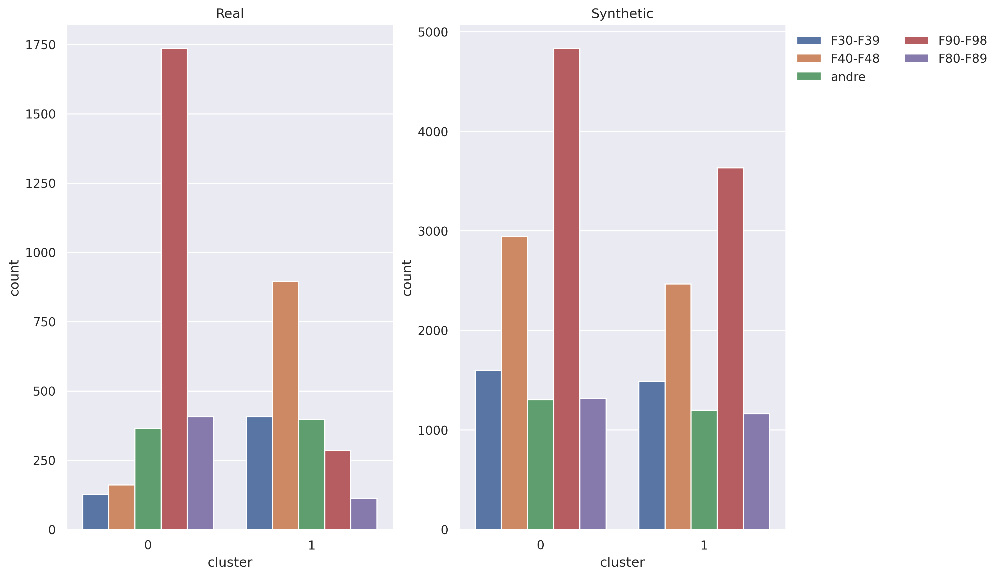

In [25]:

#fig, ax =plt.subplots(2,2)
for col in categorical_features:
    i = categorical_features.index(col)
    order = df_real[col].unique().tolist()

    fig, ax =plt.subplots(1,2)
    ax1 =sns.countplot(x='cluster', hue='{}'.format(col),data=df_real,ax=ax[0],hue_order =order)
    ax1.get_legend().set_visible(False)
    ax1.set_title('Real')
    ax2 =sns.countplot(x='cluster', hue='{}'.format(col), data=df_synth,ax=ax[1],hue_order = order)
    ax2.set_title('Synthetic')
    #ax1.set_xlabel('')
    #ax2.set_xlabel('')
    sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1), ncol=2, title=None, frameon=False)
plt.subplots_adjust(hspace = 0.8)
fig.show()




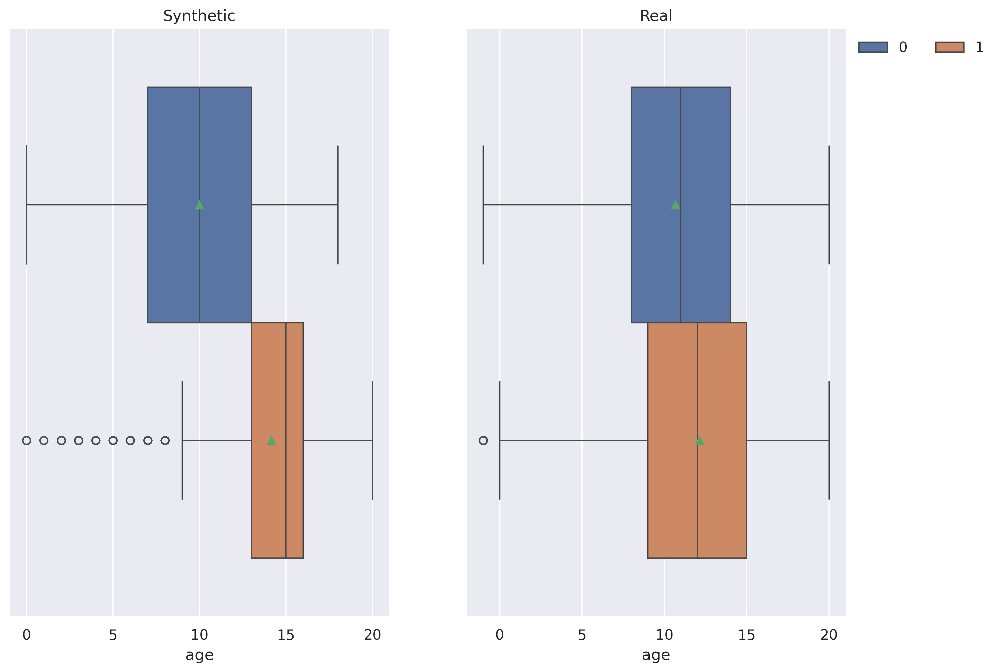

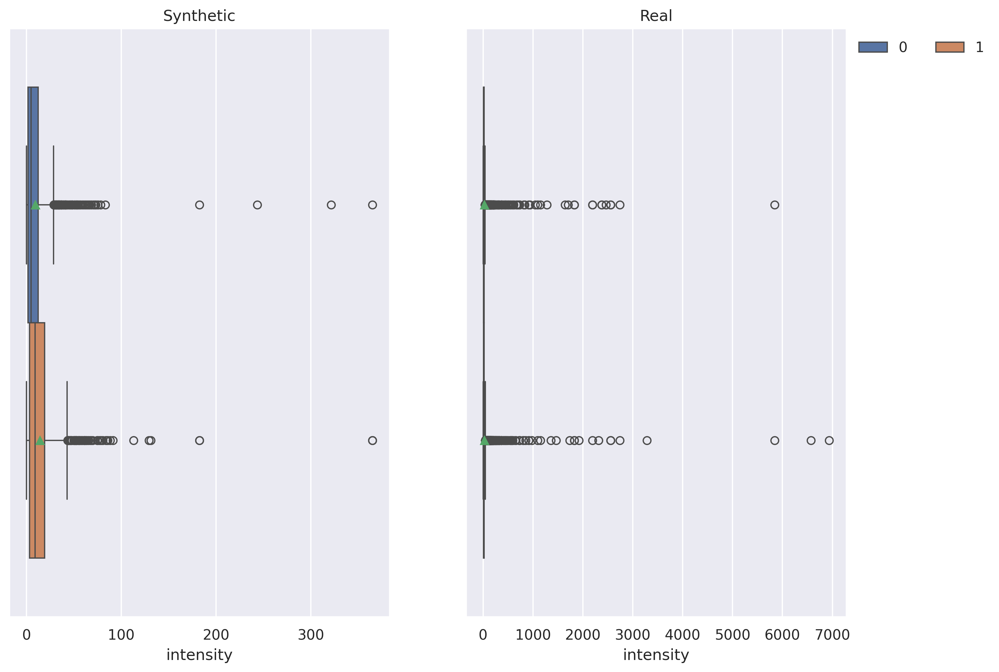

In [26]:
col='ageGrpDesc'
#fig, (ax1, ax2) = plt.subplots(len(categorical_features), 2)
#fig, ax =plt.subplots(len(numerical_features),2)
for col in numerical_features:
    i = numerical_features.index(col)
    order = df_real[col].unique().tolist()

    fig, ax =plt.subplots(1,2)
    ax1 =sns.boxplot(x=col, hue='{}'.format('cluster'),data=df_real,ax=ax[0],showmeans=True)
    ax1.get_legend().set_visible(False)
    ax1.set_title('Synthetic' )
    ax2 =sns.boxplot(x=col, hue='{}'.format('cluster'), data=df_synth,ax=ax[1],showmeans=True)
    ax2.set_title('Real')
    #ax1.set_xlabel('')
    #ax2.set_xlabel('')
    sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1), ncol=2, title=None, frameon=False)
    plt.subplots_adjust(hspace = 0.8)
    fig.show()   

In [107]:
import functions
import importlib
importlib.reload(functions)
from functions import cluster_profile

df_synth['cond1axis1Grp_1']=df_synth['cond1axis1GrpLast']
df_synth['cond1axis1Grp_2']=df_synth['cond1axis1GrpLast']

df_real['cond1axis1Grp_1']=df_real['cond1axis1GrpLast']
df_real['cond1axis1Grp_2']=df_real['cond1axis1GrpLast']

#df_synth['cond1axis1Grp_2']=df_synth['cond1axis1GrpLast']

cluster_profile(df_synth)


,sexDesc,age,intensity,cond1axis1Grp_1,cond1axis1Grp_2
cluster,,,,,
0,Male,11.0,19.434399,F90-F98,F40-F48
1,Female,12.0,23.282769,F90-F98,F40-F48


In [108]:
cluster_profile(df_real)

,sexDesc,age,intensity,cond1axis1Grp_1,cond1axis1Grp_2
cluster,,,,,
0,Male,10.0,9.462851,F90-F98,F80-F89
1,Female,15.0,14.088316,F40-F48,F30-F39


In [110]:
df_synth.cluster.value_counts()

cluster
0    2759
1    2241
Name: count, dtype: int64

In [111]:
df_real.cluster.value_counts()

cluster
0    2796
1    2099
Name: count, dtype: int64

# Classification evaluation

In [63]:
features =[
       'intensity'
     ,'cond1axis1GrpLast','age','sexDesc'
       ]
categorical_features=['cond1axis1GrpLast','sexDesc']

In [64]:
lgbm_real_data= df_referrals_real_scaled.copy()
lgbm_synth_data= df_referrals_synth_scaled.copy()

lgbm_synth_data[categorical_features] = lgbm_synth_data[categorical_features].astype('category')
lgbm_real_data[categorical_features] = lgbm_real_data[categorical_features].astype('category')
target_synth = clusters_s
target_real = clusters_r
lgbm_synth_data=lgbm_synth_data[features]  
lgbm_real_data=lgbm_real_data[features]  


#KMeans clusters
clf_kp = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
cv_scores_r = cross_val_score(clf_kp, lgbm_real_data, clusters_r, scoring='f1_weighted')




cv_scores_s = cross_val_score(clf_kp, lgbm_synth_data, clusters_s, scoring='f1_weighted')


print(f'CV F1 score for K-Means real clusters is {np.mean(cv_scores_r)}')
print(f'CV F1 score for K-Means synthetic clusters is {np.mean(cv_scores_s)}')

[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 1680, number of negative: 2236
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 3916, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.429009 -> initscore=-0.285895
[LightGBM] [Info] Start training from score -0.285895
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_

[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 2099, number of negative: 2796
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 4895, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.428805 -> initscore=-0.286729
[LightGBM] [Info] Start training from score -0.286729
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] Unknown parameter: verbose_eval
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 2241, number of negative: 2759
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 5000, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.448200 -> initscore=-0.207946
[LightGBM] [Info] Start training from score -0.207946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/opt/miniconda3/envs/sdv_env/lib/python3.10/site-packages/shap/explainers/_tree.py:382: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



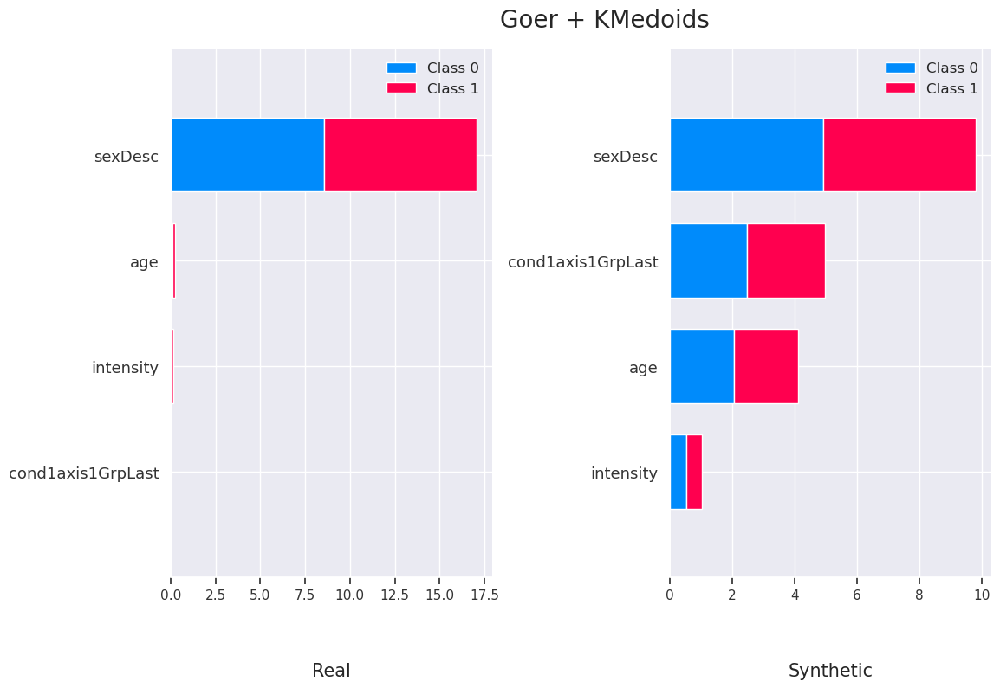

In [65]:
clf_r = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_r.fit(lgbm_real_data,  target_real)
explainer_kp = shap.TreeExplainer(clf_r)
shap_values_s = explainer_kp.shap_values(lgbm_real_data)

clf_s = LGBMClassifier(feature_fraction =0.8,verbose_eval = -1)
clf_s.fit(lgbm_synth_data,  target_synth)
explainer_kp = shap.TreeExplainer(clf_s)
shap_values_r = explainer_kp.shap_values(lgbm_synth_data)



plt.subplot(1,2,1)
fig, ax = plt.gcf(), plt.gca()
fig.suptitle('Goer + KMedoids ', fontsize=20,horizontalalignment='left')
shap.summary_plot(shap_values_r ,lgbm_real_data, plot_size=None, plot_type="bar",show=False)
fig, ax = plt.gcf(), plt.gca()
ax.set_xlabel('')


plt.title("Real", y=-0.2,fontsize = 15)

plt.subplot(1,2,2)
shap.summary_plot(shap_values_s, lgbm_synth_data, plot_size=None, plot_type="bar",show=False)
fig, ax = plt.gcf(), plt.gca()
ax.set_xlabel('')
plt.title("Synthetic", y=-0.2,fontsize = 15)
#plt.legend('',frameon=False)
#plt.tight_layout()

plt.show()

## compare clusters

In [ ]:
cluster_profile(df_real)

,ageGrpDesc,referralLength,numOfStays,cond1axis1Grp_1
cluster,,,,
0,0-12,569.0,7.0,F90-F98
1,13-19,419.0,11.0,F40-F48
2,0-12,541.0,6.0,F90-F98
3,13-19,396.0,6.0,F90-F98


In [ ]:
cluster_profile(df_synth)

,ageGrpDesc,referralLength,numOfStays,cond1axis1Grp_1
cluster,,,,
0,0-12,430.0,10.0,F90-F98
1,13-19,233.0,9.0,F40-F48
2,0-12,519.0,11.0,F90-F98
3,13-19,397.0,11.0,F90-F98
